In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

**Dilation Operation**
Dilation is another fundamental morphological operation used in image processing. It works by adding pixels to the boundaries of objects in an image, effectively expanding the shapes and filling in small holes and gaps.








**Erosion Process Recap**
Erosion involves sliding a structuring element (kernel) over the image and replacing each pixel with the minimum value within the kernel's neighborhood.

**Binary Images**
For binary images, where pixel values are typically 0 (black) or 255 (white):

**Foreground Shrinkage:**
Operation: When a kernel of ones (e.g., 5x5) is applied, each pixel's value is replaced by the minimum value within the 5x5 neighborhood.
Effect: Any pixel at the edge of a white (255) region that has at least one black (0) pixel in its 5x5 neighborhood will turn black.
**Result:** The white regions shrink, and small isolated white regions may disappear entirely.


Original_image


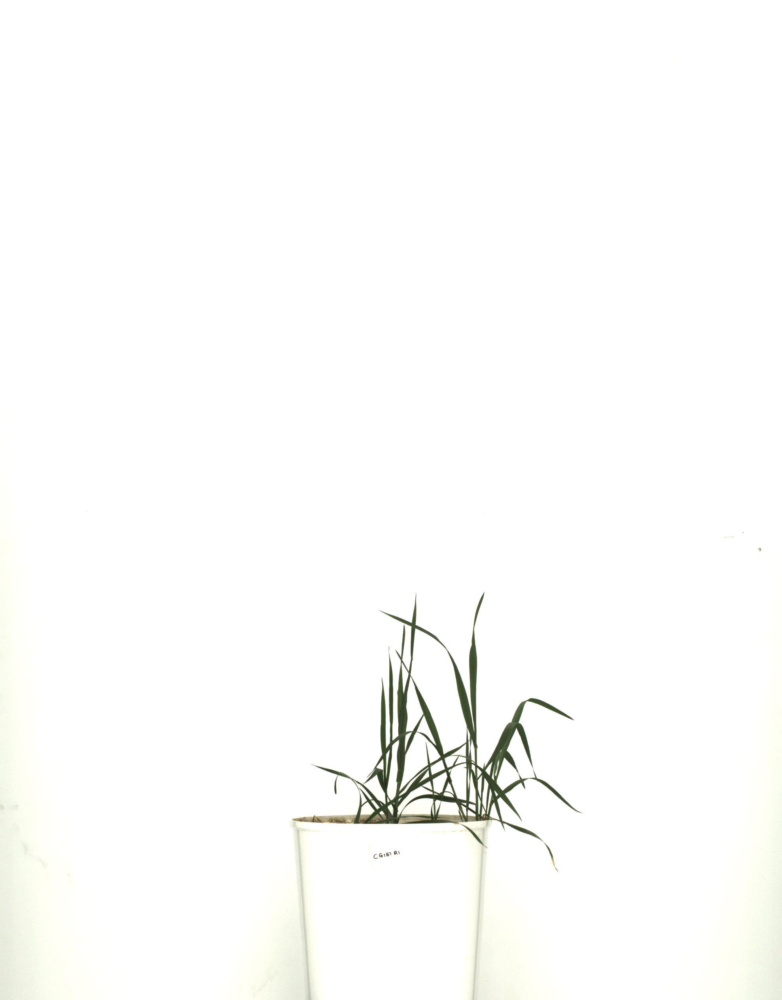

Segment_green


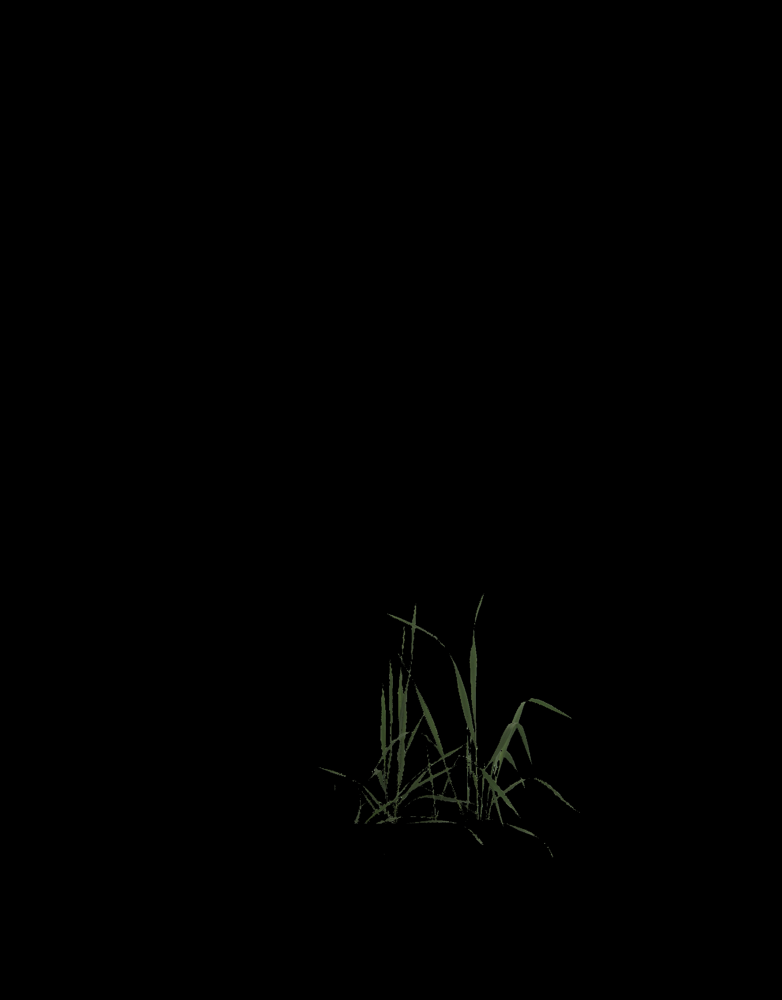

Eroded_image


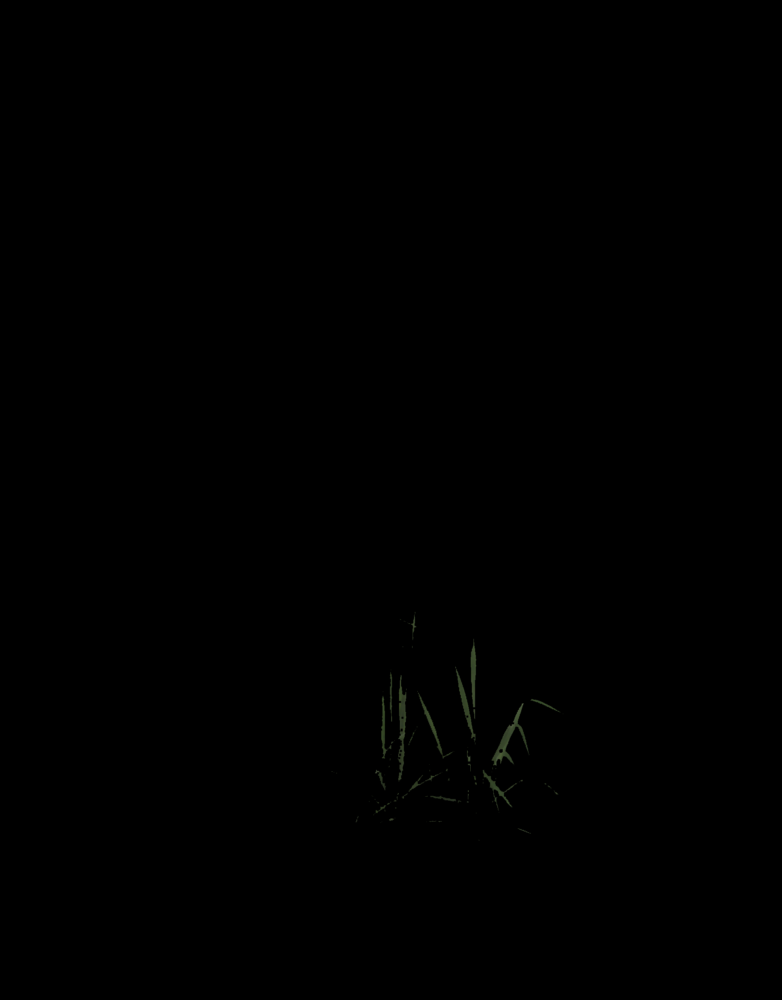

Dilation applying on Segment_green image 


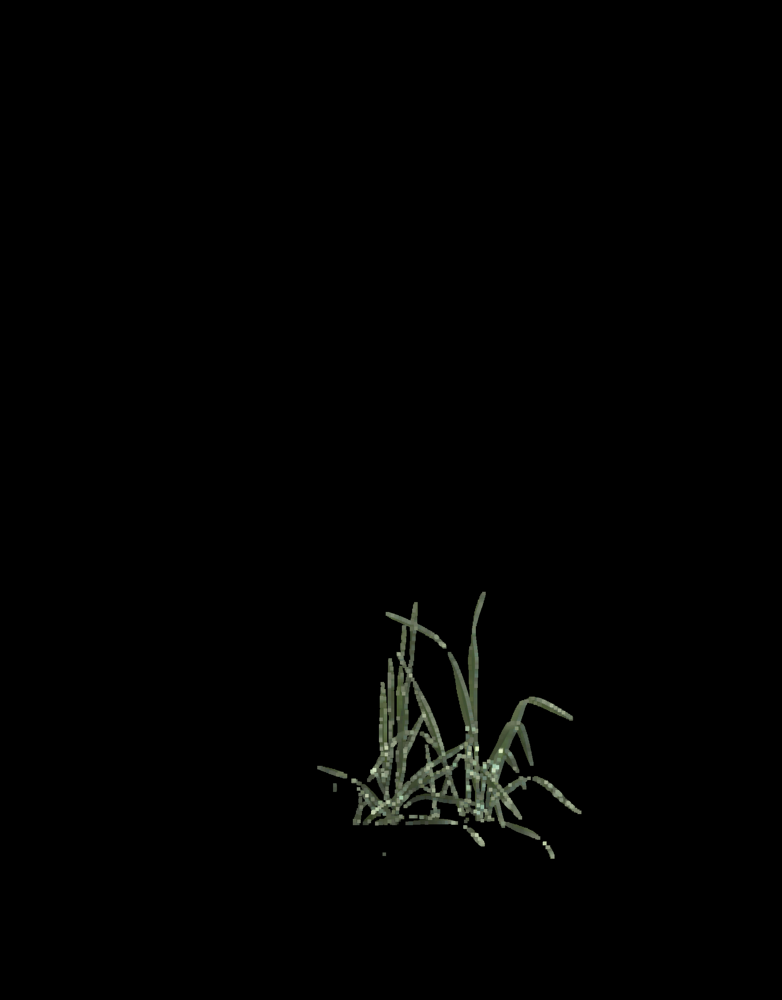

Opening_image applying on Dilation image


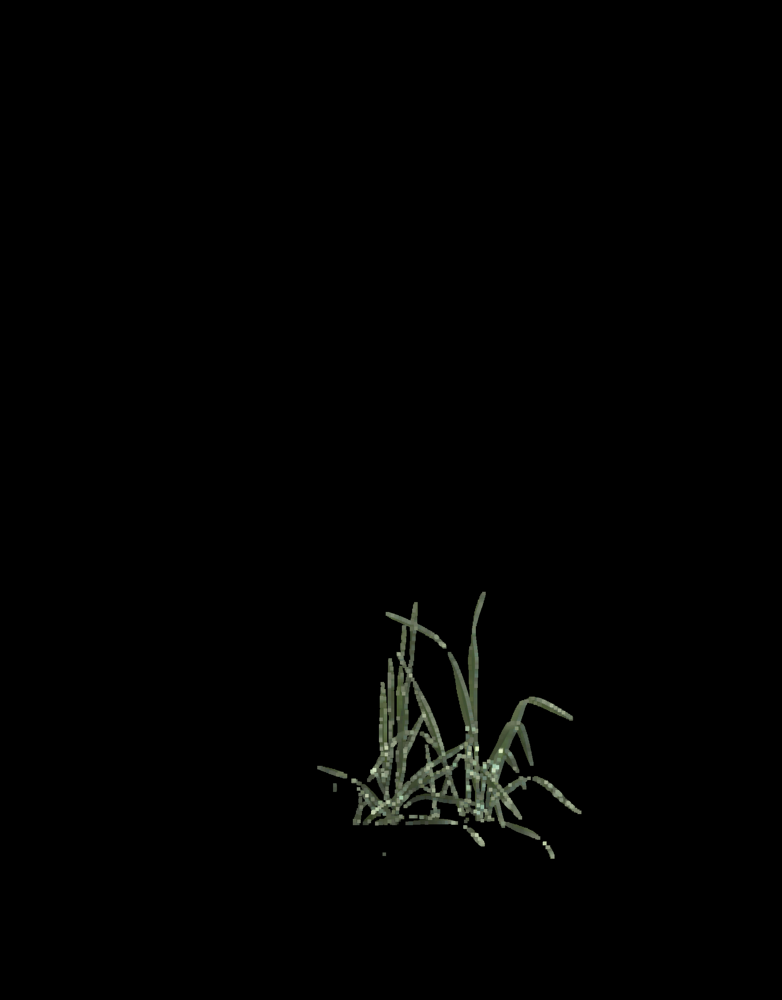

apply Eroded on Opening image


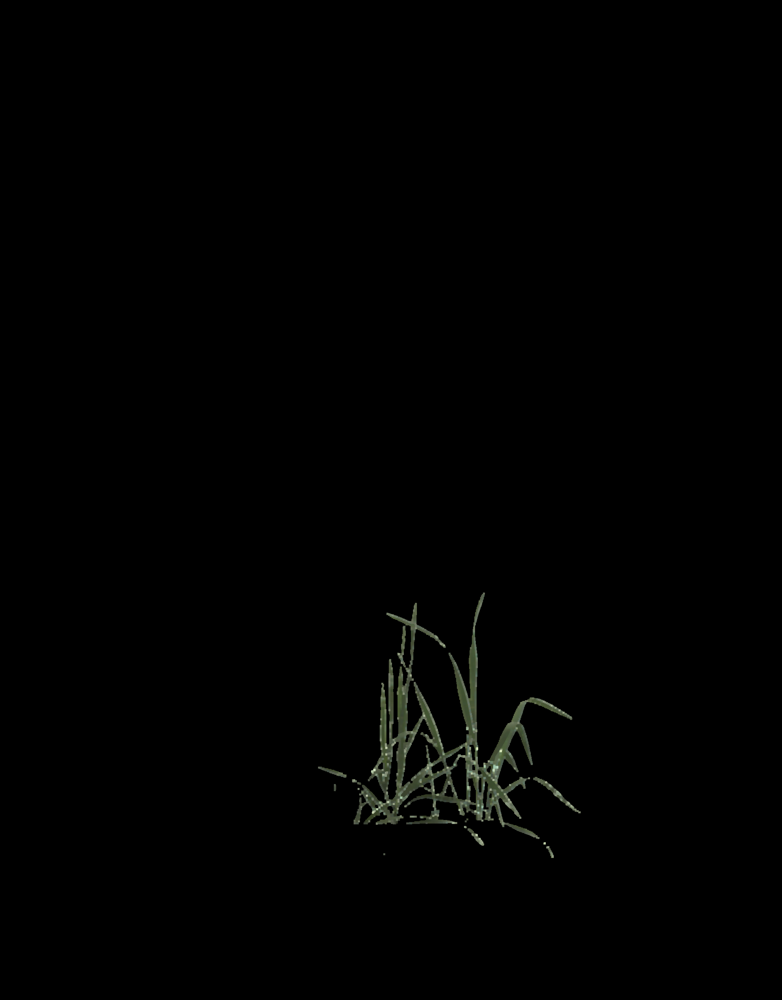

applying Closing on Eroded Opening image


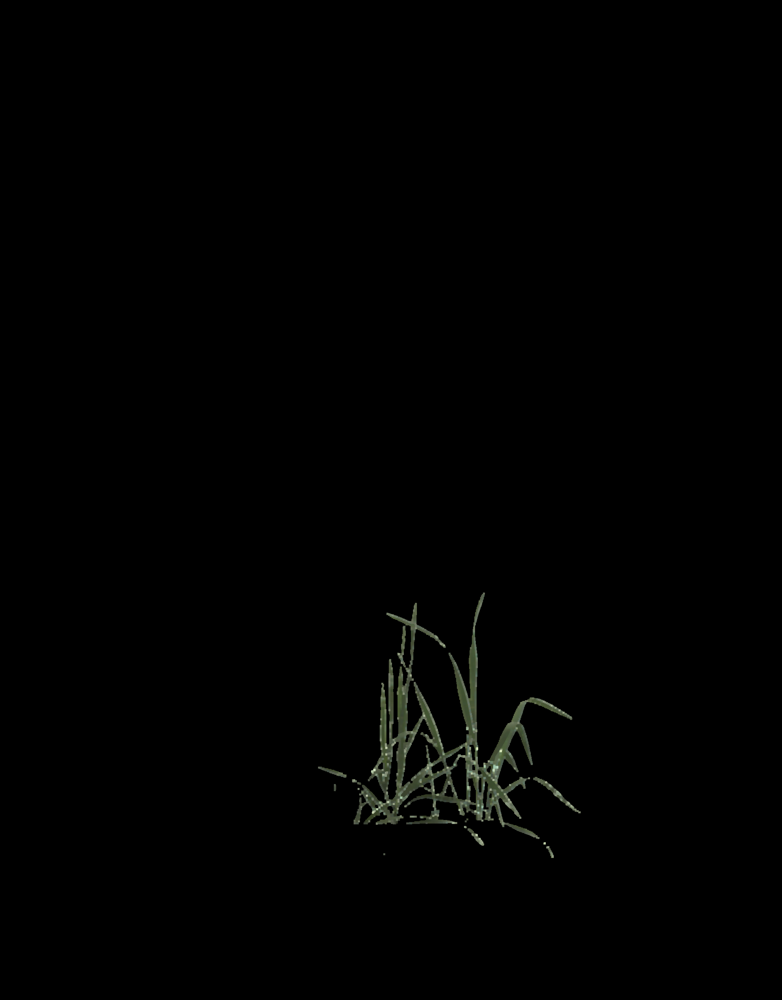

applying Denoisung on Closing,Eroded,Opening image


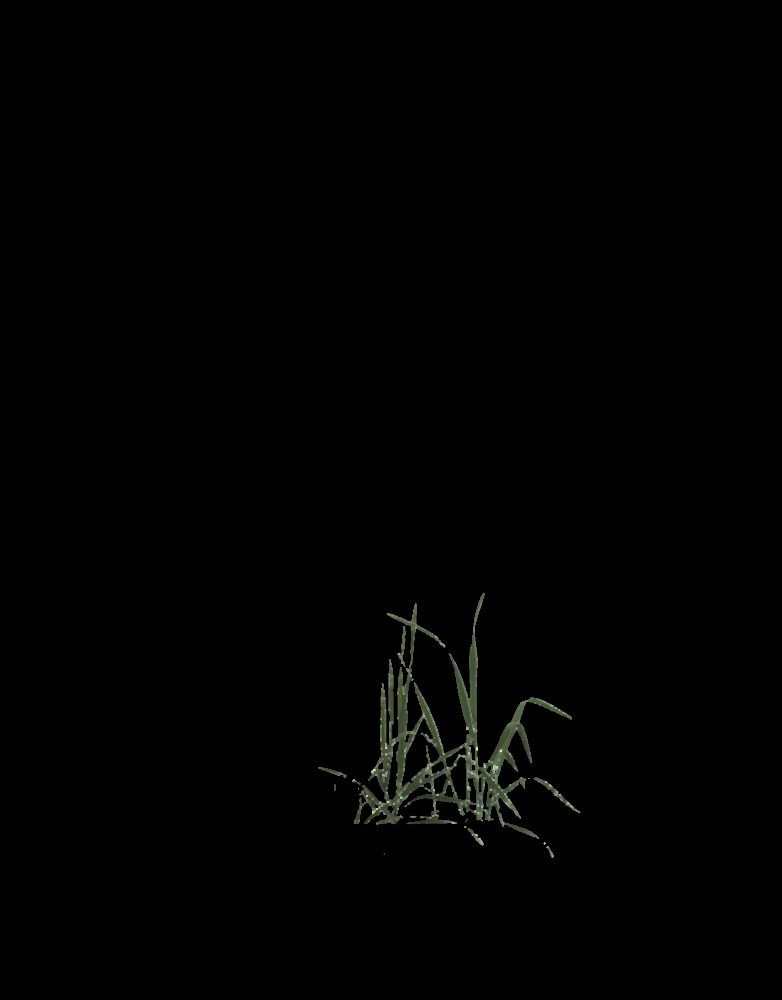

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow in this cell




def neighborhood_analysis(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

    # Create an output image to draw the results
    output_image = np.zeros(image.shape, dtype=np.uint8)

    # Remove small components
    for i in range(1, num_labels):
        if stats[i, cv2.CC_STAT_AREA] >= 500:  # Adjust threshold as needed
            output_image[labels == i] = image[labels == i]

    return output_image, num_labels, stats, centroids






def segment_green(image, threshold=50):
  hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
  lower_green = np.array([40, 40, 40])  # Adjust these values if needed
  upper_green = np.array([70, 255, 255])  # Adjust these values if needed
  mask = cv2.inRange(hsv_image, lower_green, upper_green)
  segmented = cv2.bitwise_and(image, image, mask=mask)
  return segmented


def morphological(segmented_green):
  #gray = cv2.cvtColor(segmented_green, cv2.COLOR_BGR2GRAY)
  kernel = np.ones((5, 5), np.uint8)
  eroded = cv2.erode(segmented_green, kernel, iterations=1)
  return eroded


def dilated(segmented_green):
  kernel = np.ones((5, 5), np.uint8)
  dilat=cv2.dilate(segmented_green,kernel,iterations=2)
  return dilat


def open(image3):
  kernel =np.ones((5, 5), np.uint8)
  opening=cv2.morphologyEx(image3, cv2.MORPH_OPEN, kernel)
  return opening



def close(image5):
  kernel =np.ones((5, 5), np.uint8)
  closing = cv2.morphologyEx(image5, cv2.MORPH_CLOSE, kernel)
  return closing


#def rgb_to_blackwhite(image_path):
    # Read the RGB image
   # rgb_image = cv2.imread(image_path)

    # Convert RGB to Grayscale
    #gray_image = cv2.cvtColor(image_path, cv2.COLOR_BGR2GRAY)

    # Convert Grayscale to Black and White (Binary)
    #_, blackwhite_image = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)

    #return blackwhite_image


import cv2
import numpy as np







image_path='/content/drive/MyDrive/IMAGEprossing/0_0_0.png'
image=cv2.imread(image_path)
if image is None:
    print(f"Error: Unable to load the image at {image_path}. Please check the file path and format.")
else:
    # Segment the green region
    print('Original_image')
    cv2_imshow(image)
    segmented_green = segment_green(image)
    print('Segment_green')
    cv2_imshow(segmented_green)
    image2= morphological(segmented_green)
    print('Eroded_image')
    cv2_imshow(image2)
    image3=dilated(segmented_green)
    print('Dilation applying on Segment_green image ')
    cv2_imshow(image3)
    image4=open(image3) #because we have to sharp the image3(dilation_image)
    print('Opening_image applying on Dilation image')
    cv2_imshow(image4)
    image5=morphological(image4) # we have to apply Eroded on opening image
    print('apply Eroded on Opening image')
    cv2_imshow(image5)
    image6=close(image5)
    print('applying Closing on Eroded Opening image') # BecauseIt is used primarily for filling small holes and gaps in an image, while preserving the shape and size of larger objects in the image.
    cv2_imshow(image6)


    # Convert the image from BGR to HSV color space
    hsv = cv2.cvtColor(image6, cv2.COLOR_BGR2HSV)
    lower_bound = np.array([40, 40, 40])
    upper_bound = np.array([70, 255, 255])
    mask = cv2.inRange(hsv, lower_bound, upper_bound)
    # Apply median blur to reduce noise
    mask = cv2.medianBlur(mask, 5)
    green_only = cv2.bitwise_and(image6, image6, mask=mask)
    print('applying Denoisung on Closing,Eroded,Opening image')
    cv2_imshow(green_only)
    #output_image = rgb_to_blackwhite(green_only)
    #cv2.imwrite("output_image.jpg", output_image)
    #cv2_imshow(output_image)

    ##analyzed_image = neighborhood_analysis(green_only)
    #print('applying Neighborhood analysis on Denosing,Closing,Eroded,Opening image')
    #cv2_imshow(analyzed_image)

    # ... (rest of the code)

    #output_image, _, _, _ = neighborhood_analysis(green_only) # unpack the tuple and take only the image
    #print('applying Neighborhood analysis on Denosing,Closing,Eroded,Opening image')
    #cv2_imshow(output_image) # display the image

# ... (rest of the code)





Original_image


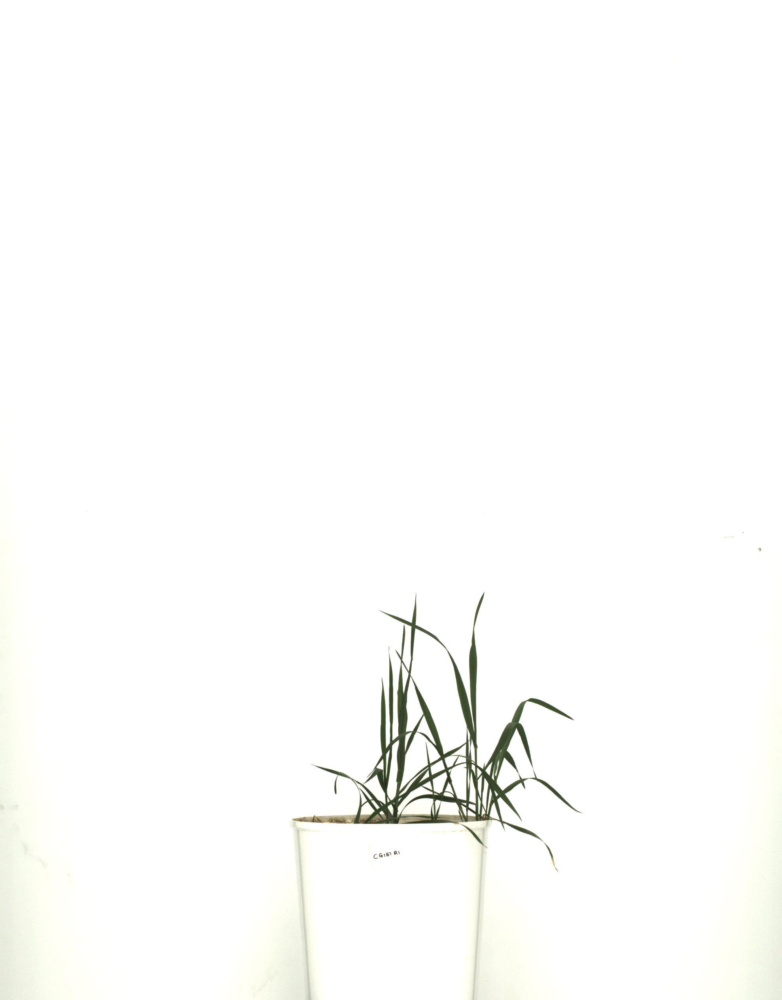

Segment_green


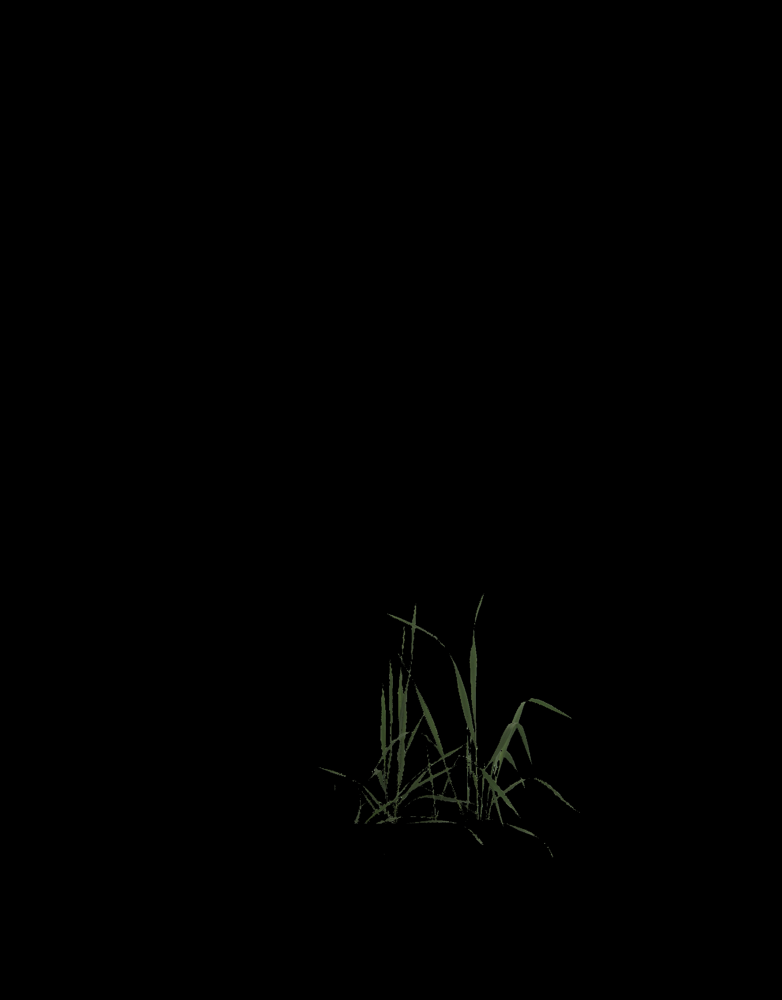

Eroded_image


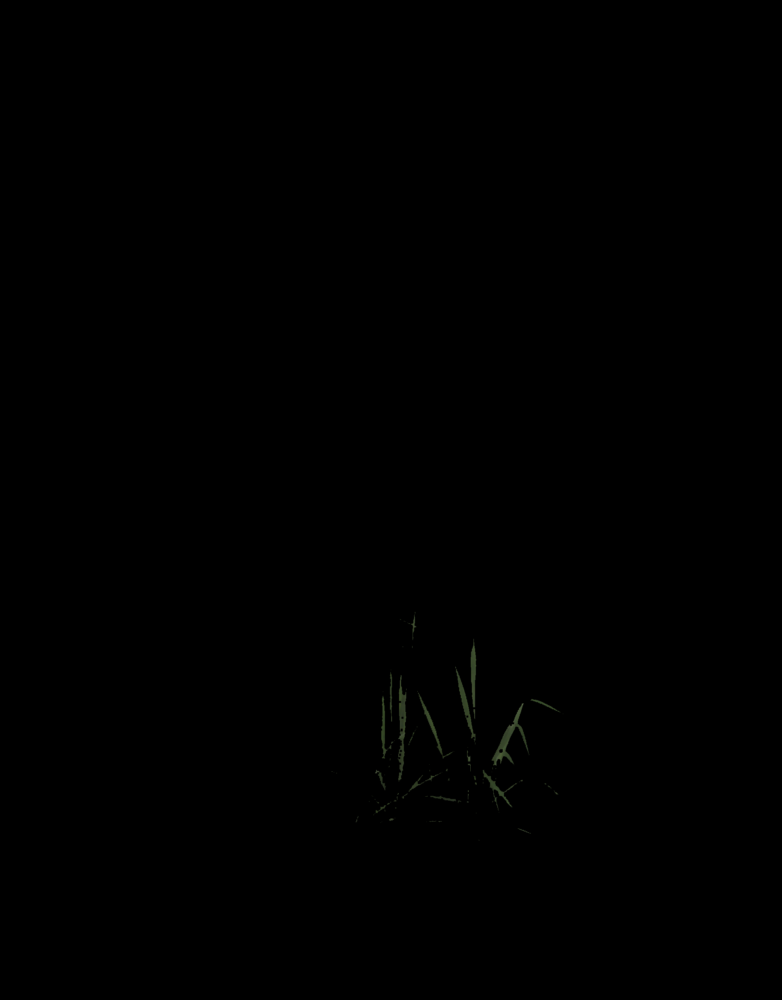

Dilation applying on Segment_green image


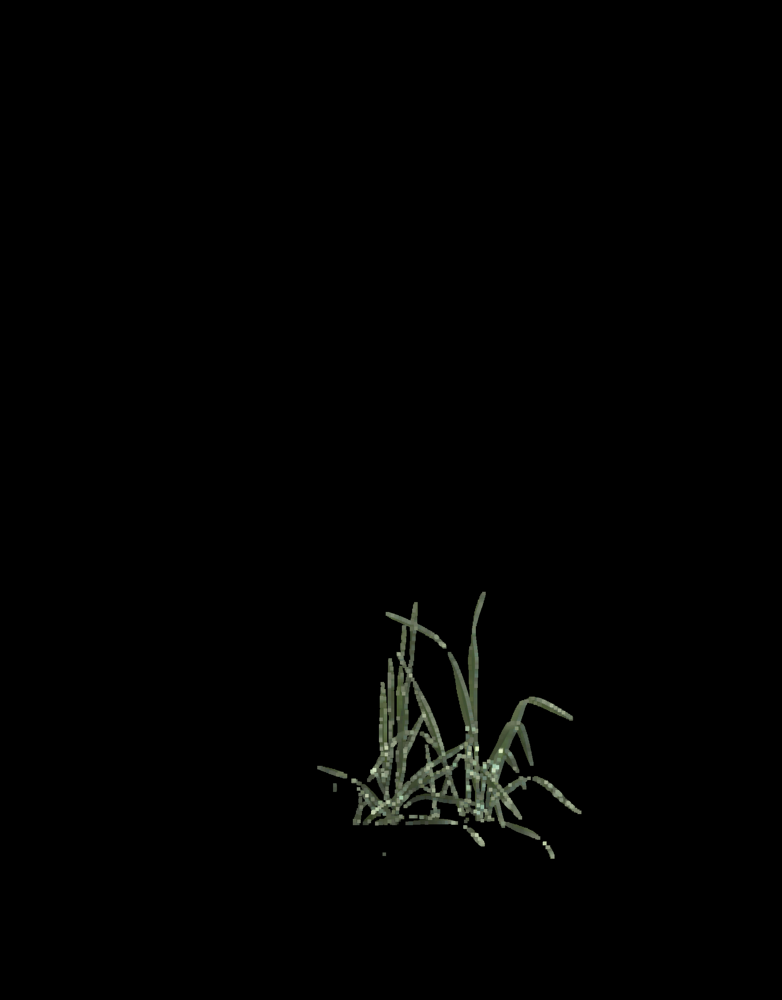

Opening_image applying on Dilation image


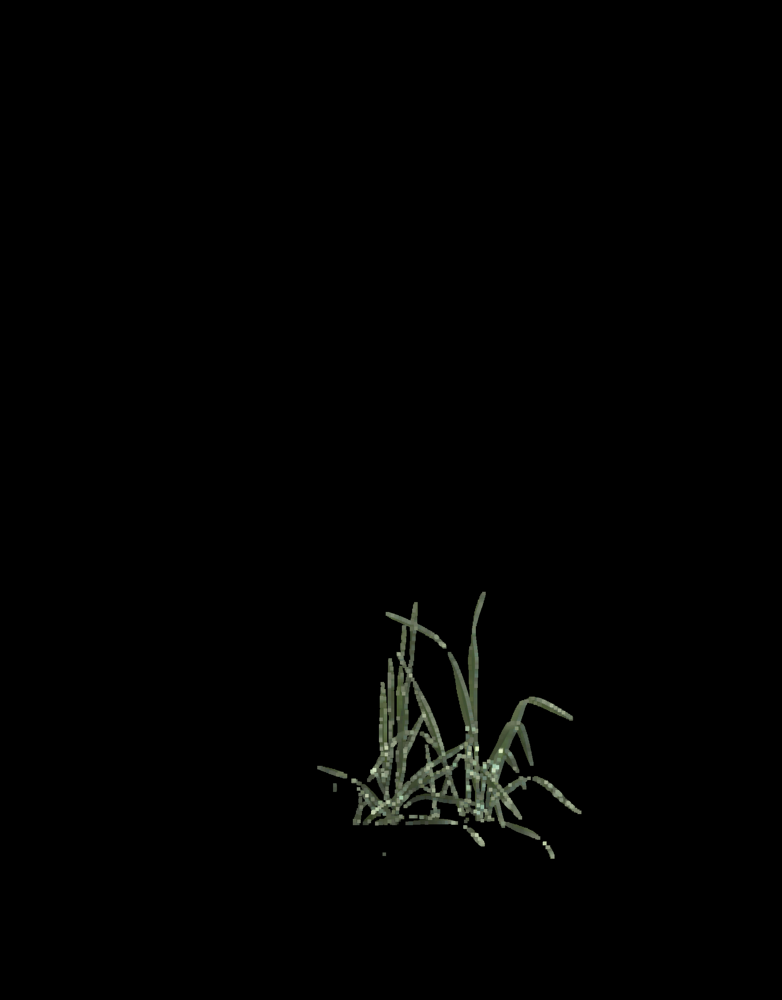

apply Eroded on Opening image


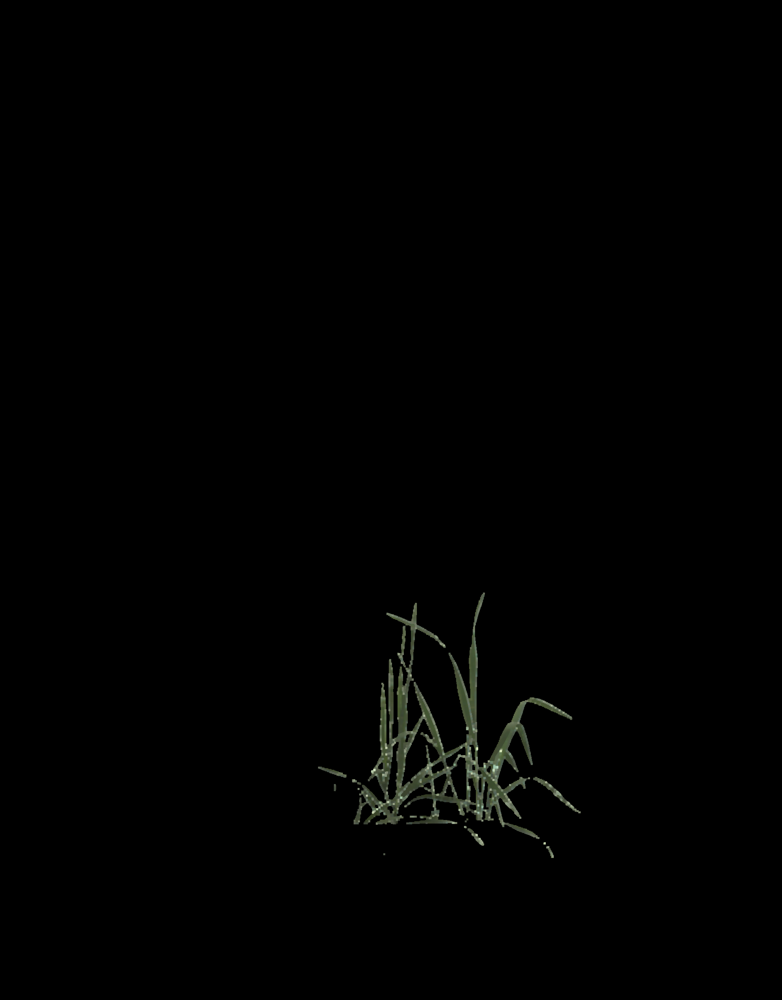

applying Closing on Eroded Opening image


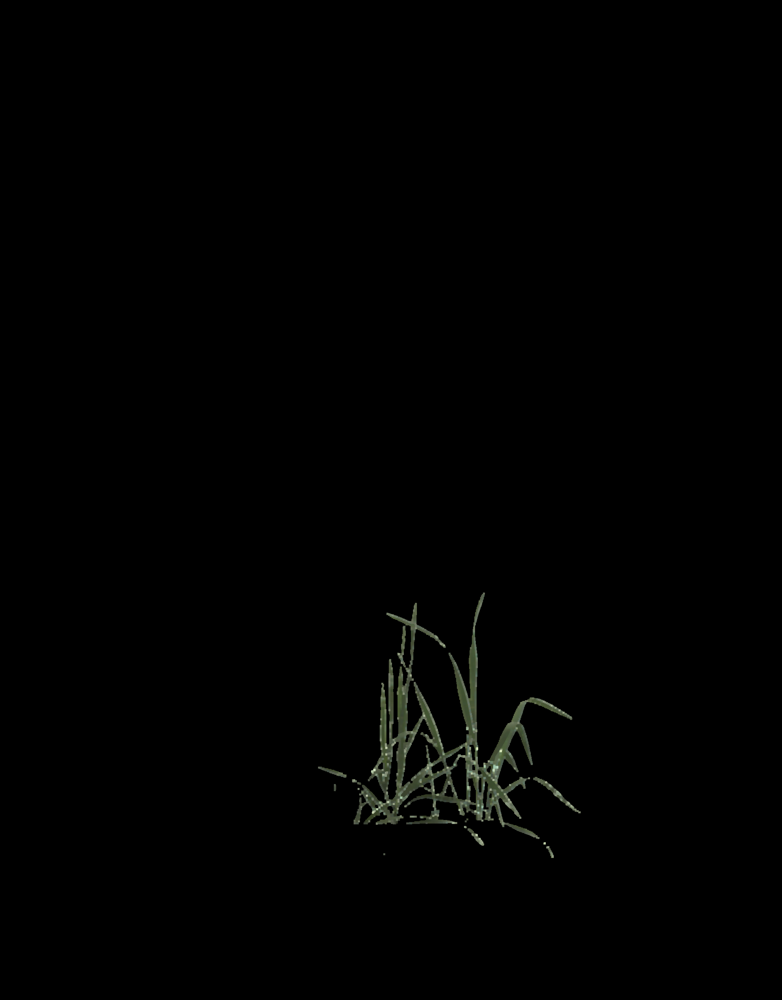

applying Denoising on Closing, Eroded, Opening image


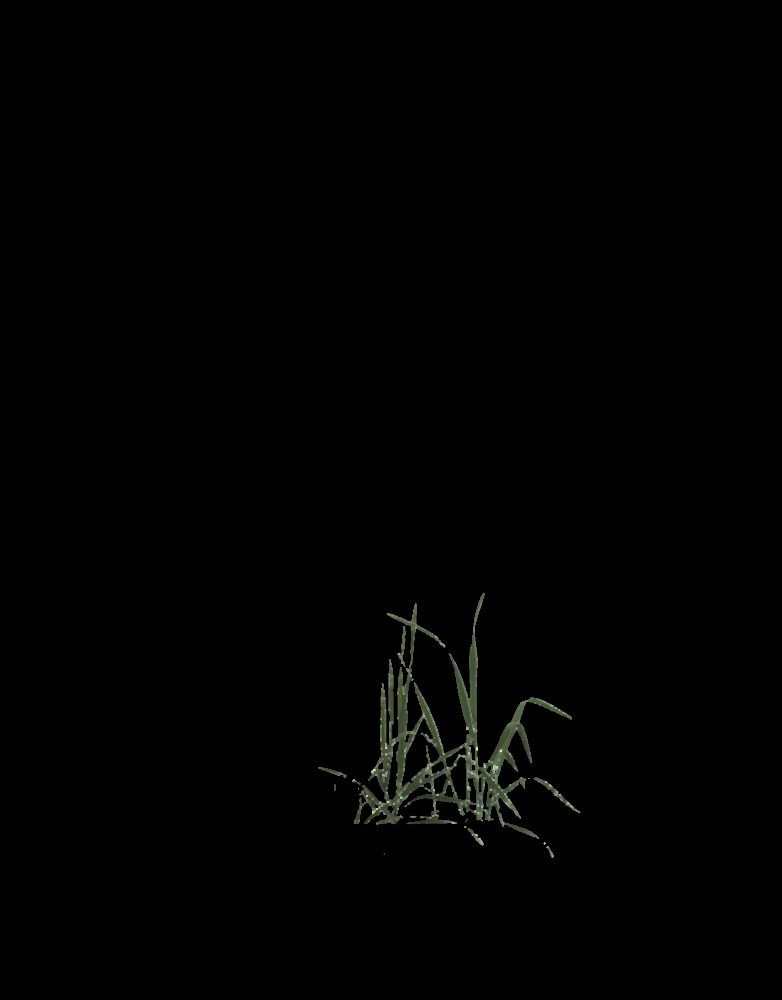

Inverted green_only image (black regions are white and non-black regions are black)


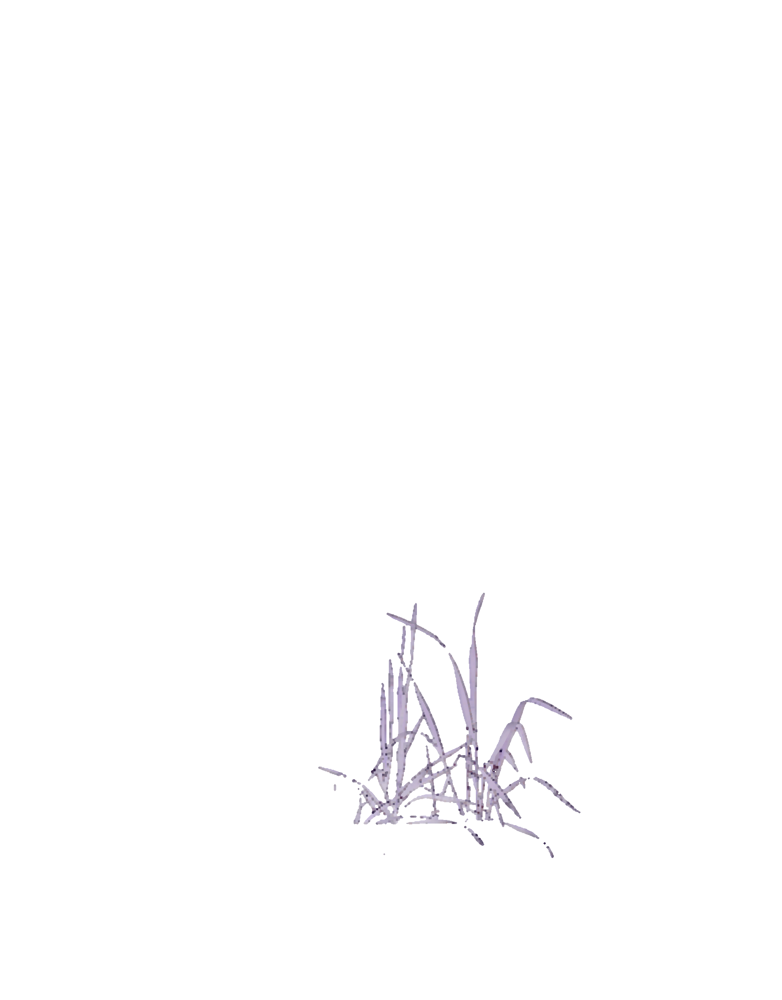

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow in this cell

def neighborhood_analysis(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

    # Create an output image to draw the results
    output_image = np.zeros(image.shape, dtype=np.uint8)

    # Remove small components
    for i in range(1, num_labels):
        if stats[i, cv2.CC_STAT_AREA] >= 500:  # Adjust threshold as needed
            output_image[labels == i] = image[labels == i]

    return output_image, num_labels, stats, centroids

def segment_green(image, threshold=50):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower_green = np.array([40, 40, 40])  # Adjust these values if needed
    upper_green = np.array([70, 255, 255])  # Adjust these values if needed
    mask = cv2.inRange(hsv_image, lower_green, upper_green)
    segmented = cv2.bitwise_and(image, image, mask=mask)
    return segmented

def morphological(segmented_green):
    kernel = np.ones((5, 5), np.uint8)
    eroded = cv2.erode(segmented_green, kernel, iterations=1)
    return eroded

def dilated(segmented_green):
    kernel = np.ones((5, 5), np.uint8)
    dilat = cv2.dilate(segmented_green, kernel, iterations=2)
    return dilat

def open(image3):
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(image3, cv2.MORPH_OPEN, kernel)
    return opening

def close(image5):
    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(image5, cv2.MORPH_CLOSE, kernel)
    return closing

# Read the image
image_path = '/content/drive/MyDrive/IMAGEprossing/0_0_0.png'
image = cv2.imread(image_path)
if image is None:
    print(f"Error: Unable to load the image at {image_path}. Please check the file path and format.")
else:
    # Segment the green region
    print('Original_image')
    cv2_imshow(image)
    segmented_green = segment_green(image)
    print('Segment_green')
    cv2_imshow(segmented_green)
    image2 = morphological(segmented_green)
    print('Eroded_image')
    cv2_imshow(image2)
    image3 = dilated(segmented_green)
    print('Dilation applying on Segment_green image')
    cv2_imshow(image3)
    image4 = open(image3)  # Because we have to sharpen the image3 (dilation_image)
    print('Opening_image applying on Dilation image')
    cv2_imshow(image4)
    image5 = morphological(image4)  # We have to apply erosion on the opening image
    print('apply Eroded on Opening image')
    cv2_imshow(image5)
    image6 = close(image5)
    print('applying Closing on Eroded Opening image')  # It is used primarily for filling small holes and gaps in an image, while preserving the shape and size of larger objects in the image.
    cv2_imshow(image6)

    # Convert the image from BGR to HSV color space
    hsv = cv2.cvtColor(image6, cv2.COLOR_BGR2HSV)
    lower_bound = np.array([40, 40, 40])
    upper_bound = np.array([70, 255, 255])
    mask = cv2.inRange(hsv, lower_bound, upper_bound)
    # Apply median blur to reduce noise
    mask = cv2.medianBlur(mask, 5)
    green_only = cv2.bitwise_and(image6, image6, mask=mask)
    print('applying Denoising on Closing, Eroded, Opening image')
    cv2_imshow(green_only)

    # Invert the green_only image
    inverted_green_only = cv2.bitwise_not(green_only)
    print('Inverted green_only image (black regions are white and non-black regions are black)')
    cv2_imshow(inverted_green_only)

    # Optionally apply neighborhood analysis
    # analyzed_image = neighborhood_analysis(green_only)
    # print('applying Neighborhood analysis on Denoising, Closing, Eroded, Opening image')
    # cv2_imshow(analyzed_image)

    # output_image, _, _, _ = neighborhood_analysis(green_only)  # unpack the tuple and take only the image
    # print('applying Neighborhood analysis on Denoising, Closing, Eroded, Opening image')
    # cv2_imshow(output_image)  # display the image


In [ ]:
def find_green_bounds(image6):


    if image is None:
        print(f"Error: Unable to load the image at {image_path}. Please check the file path and format.")
        return None, None

    # Create a window
    cv2.namedWindow('Trackbars')

    # Create trackbars for lower and upper HSV values
    cv2.createTrackbar('Lower H', 'Trackbars', 40, 180, nothing)
    cv2.createTrackbar('Lower S', 'Trackbars', 40, 255, nothing)
    cv2.createTrackbar('Lower V', 'Trackbars', 40, 255, nothing)
    cv2.createTrackbar('Upper H', 'Trackbars', 70, 180, nothing)
    cv2.createTrackbar('Upper S', 'Trackbars', 255, 255, nothing)
    cv2.createTrackbar('Upper V', 'Trackbars', 255, 255, nothing)

    while True:
        # Get current positions of trackbars
        lower_h = cv2.getTrackbarPos('Lower H', 'Trackbars')
        lower_s = cv2.getTrackbarPos('Lower S', 'Trackbars')
        lower_v = cv2.getTrackbarPos('Lower V', 'Trackbars')
        upper_h = cv2.getTrackbarPos('Upper H', 'Trackbars')
        upper_s = cv2.getTrackbarPos('Upper S', 'Trackbars')
        upper_v = cv2.getTrackbarPos('Upper V', 'Trackbars')

        # Set the lower and upper bounds for green
        lower_bound = np.array([lower_h, lower_s, lower_v])
        upper_bound = np.array([upper_h, upper_s, upper_v])


        break



    return lower_bound, upper_bound

**we separate red ,green,blue channel and thresholding over this channel**

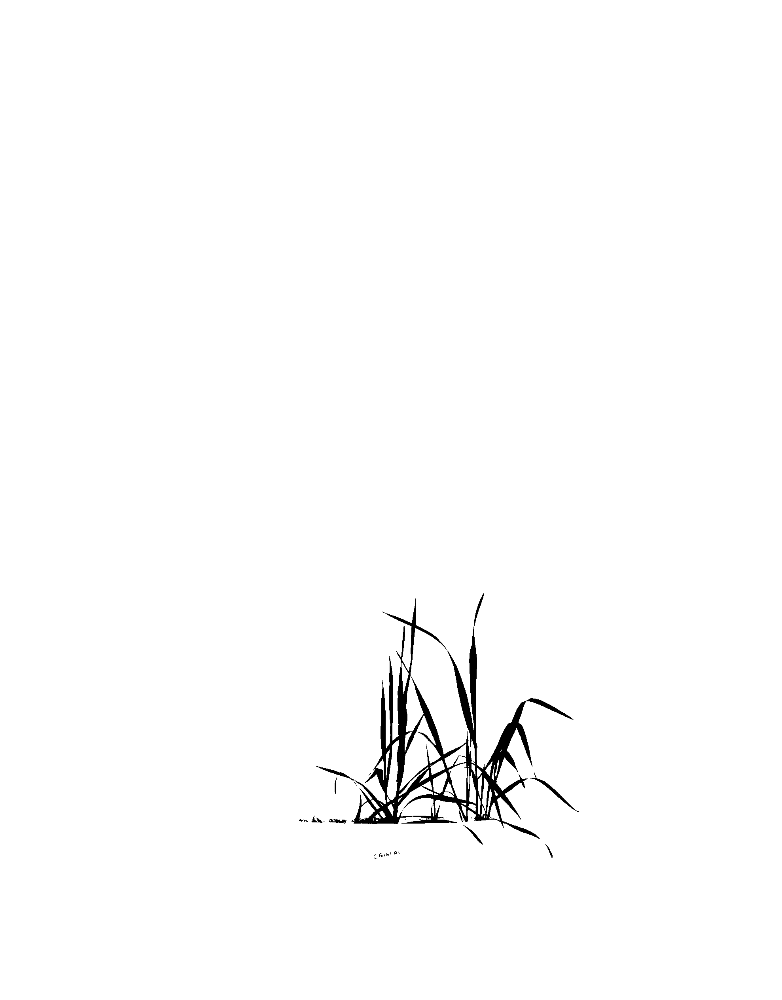

Minimum Intensity: 0
Maximum Intensity: 255
Mean Intensity Green: 252.04440464070993


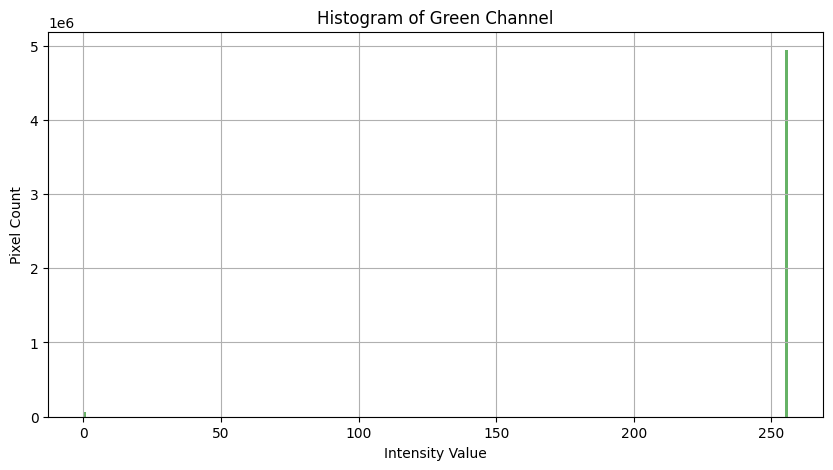

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt



def plot_histogram(image, channel_name):
    plt.figure(figsize=(10, 5))
    plt.hist(image.ravel(), bins=256, range=(0, 256), color='green', alpha=0.6)
    plt.title(f'Histogram of {channel_name} Channel')
    plt.xlabel('Intensity Value')
    plt.ylabel('Pixel Count')
    plt.grid(True)
    plt.show()

def green_channel_image(image_path):
    # Read the RGB image
    rgb_image = cv2.imread(image_path)

    # Extract the Green channel
    green_channel = rgb_image[:, :, 1]


    _, blackwhite_image = cv2.threshold(green_channel, 127, 255, cv2.THRESH_BINARY)

    return blackwhite_image

def check_intensity(image):
    min_intensity = np.min(image)
    max_intensity = np.max(image)
    mean_intensity = np.mean(image)
    return min_intensity, max_intensity, mean_intensity

# Example usage
input_image_path = "/content/drive/MyDrive/IMAGEprossing/0_0_0.png"
output_image = green_channel_image(input_image_path)
cv2.imwrite("output_image.jpg", output_image)

# Display the output image
cv2_imshow(output_image)

# Check the intensity of the output image
min_intensity, max_intensity, mean_intensity = check_intensity(output_image)
print(f"Minimum Intensity: {min_intensity}")
print(f"Maximum Intensity: {max_intensity}")
print(f"Mean Intensity Green: {mean_intensity}")




plot_histogram(output_image, "Green")


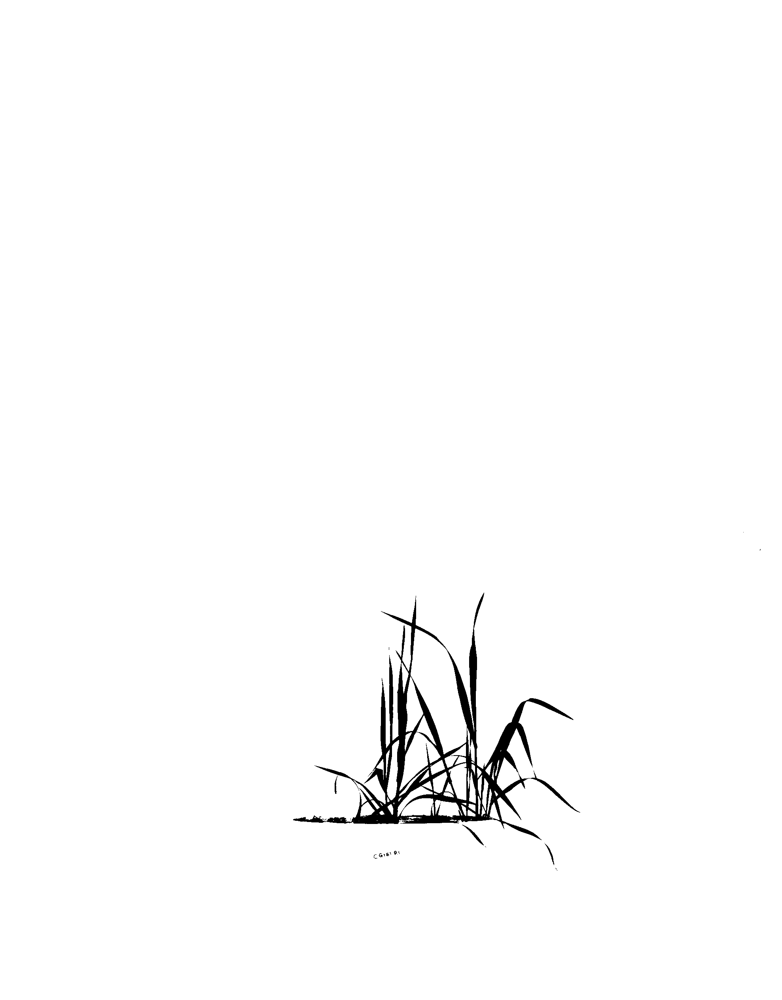

Minimum Intensity: 0
Maximum Intensity: 255
Mean Intensity Blue: 251.78199912122318


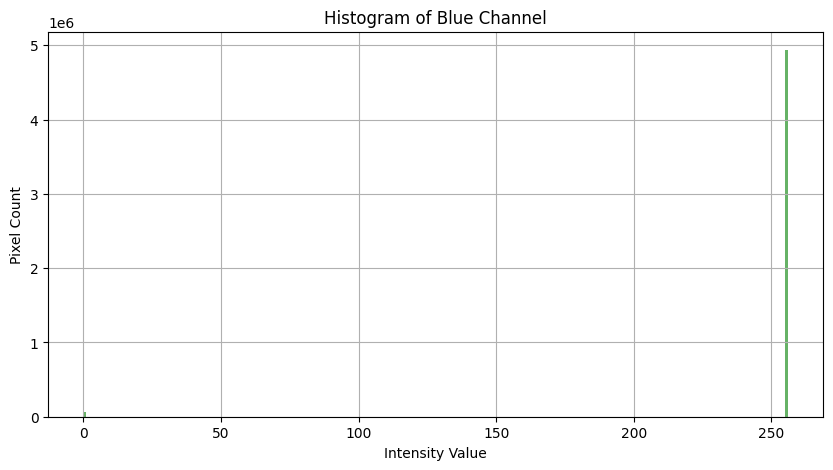

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt



def plot_histogram(image, channel_name):
    plt.figure(figsize=(10, 5))
    plt.hist(image.ravel(), bins=256, range=(0, 256), color='green', alpha=0.6)
    plt.title(f'Histogram of {channel_name} Channel')
    plt.xlabel('Intensity Value')
    plt.ylabel('Pixel Count')
    plt.grid(True)
    plt.show()

def green_channel_image(image_path):
    # Read the RGB image
    rgb_image = cv2.imread(image_path)

    # Extract the Green channel
    green_channel = rgb_image[:, :, 0]

    # Convert Grayscale to Black and White (Binary)
    _, blackwhite_image = cv2.threshold(green_channel, 127, 255, cv2.THRESH_BINARY)

    return blackwhite_image

def check_intensity(image):
    min_intensity = np.min(image)
    max_intensity = np.max(image)
    mean_intensity = np.mean(image)
    return min_intensity, max_intensity, mean_intensity

# Example usage
input_image_path = "/content/drive/MyDrive/IMAGEprossing/0_0_0.png"
output_image = green_channel_image(input_image_path)
cv2.imwrite("output_image.jpg", output_image)

# Display the output image
cv2_imshow(output_image)

# Check the intensity of the output image
min_intensity, max_intensity, mean_intensity = check_intensity(output_image)
print(f"Minimum Intensity: {min_intensity}")
print(f"Maximum Intensity: {max_intensity}")
print(f"Mean Intensity Blue: {mean_intensity}")




plot_histogram(output_image, "Blue")


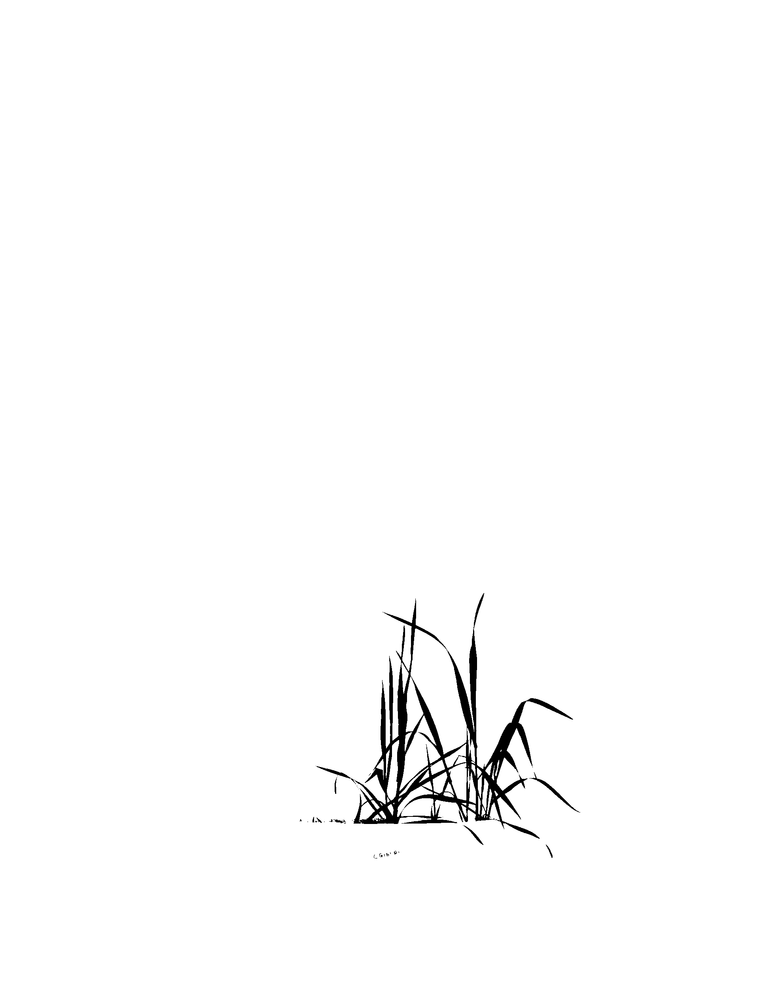

Minimum Intensity: 0
Maximum Intensity: 255
Mean Intensity Red: 252.04853741284262


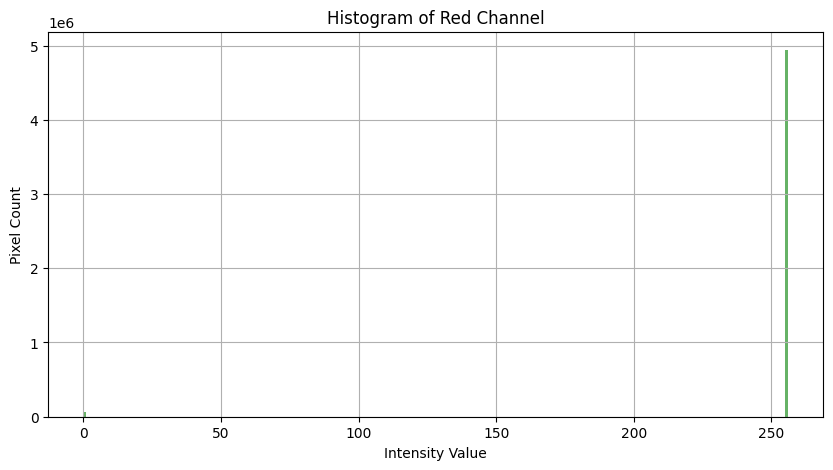

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt



def plot_histogram(image, channel_name):
    plt.figure(figsize=(10, 5))
    plt.hist(image.ravel(), bins=256, range=(0, 256), color='green', alpha=0.6)
    plt.title(f'Histogram of {channel_name} Channel')
    plt.xlabel('Intensity Value')
    plt.ylabel('Pixel Count')
    plt.grid(True)
    plt.show()

def green_channel_image(image_path):
    # Read the RGB image
    rgb_image = cv2.imread(image_path)

    # Extract the Green channel
    green_channel = rgb_image[:, :, 2]

    # Convert Grayscale to Black and White (Binary)
    _, blackwhite_image = cv2.threshold(green_channel, 127, 255, cv2.THRESH_BINARY)

    return blackwhite_image

def check_intensity(image):
    min_intensity = np.min(image)
    max_intensity = np.max(image)
    mean_intensity = np.mean(image)
    return min_intensity, max_intensity, mean_intensity

# Example usage
input_image_path = "/content/drive/MyDrive/IMAGEprossing/0_0_0.png"
output_image = green_channel_image(input_image_path)
cv2.imwrite("output_image.jpg", output_image)

# Display the output image
cv2_imshow(output_image)

# Check the intensity of the output image
min_intensity, max_intensity, mean_intensity = check_intensity(output_image)
print(f"Minimum Intensity: {min_intensity}")
print(f"Maximum Intensity: {max_intensity}")
print(f"Mean Intensity Red: {mean_intensity}")




plot_histogram(output_image, "Red")


Saving 0_0_0.png to 0_0_0.png
Original Image:


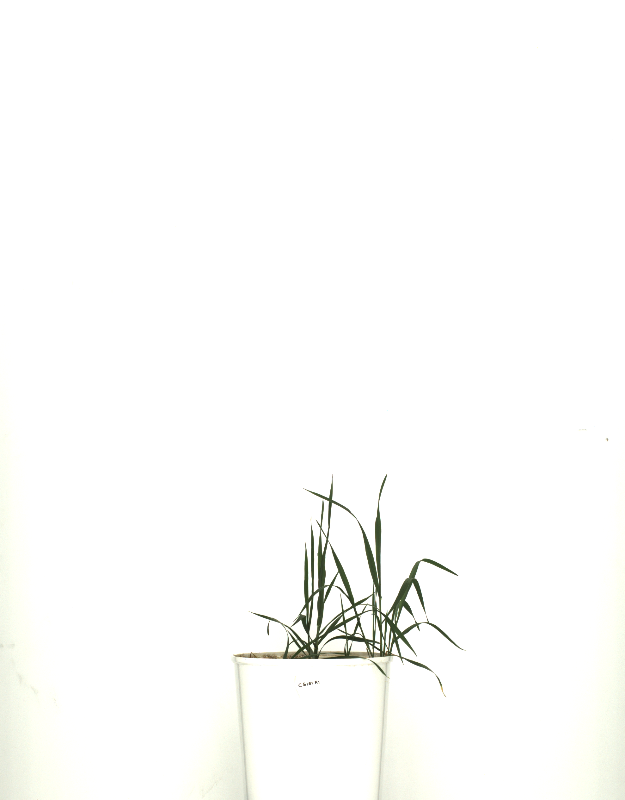

Mask:


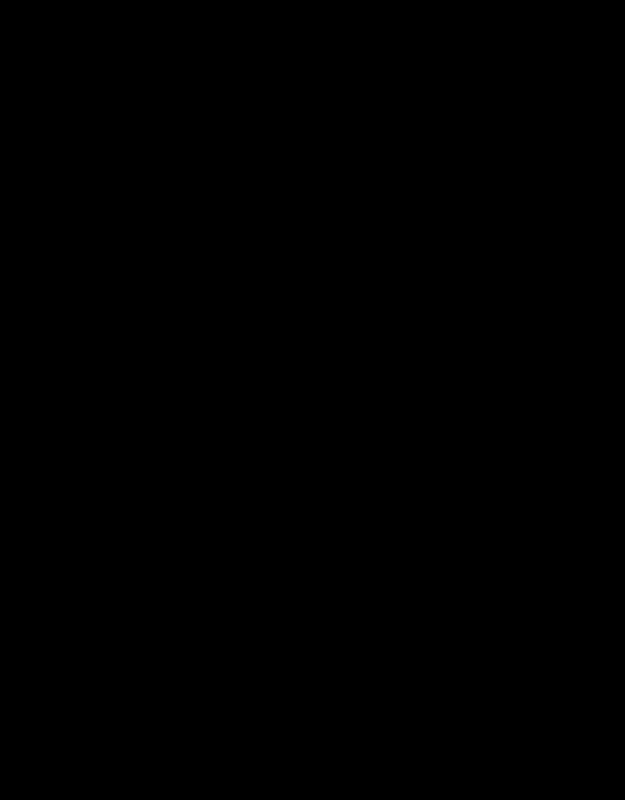

Segmented Image:


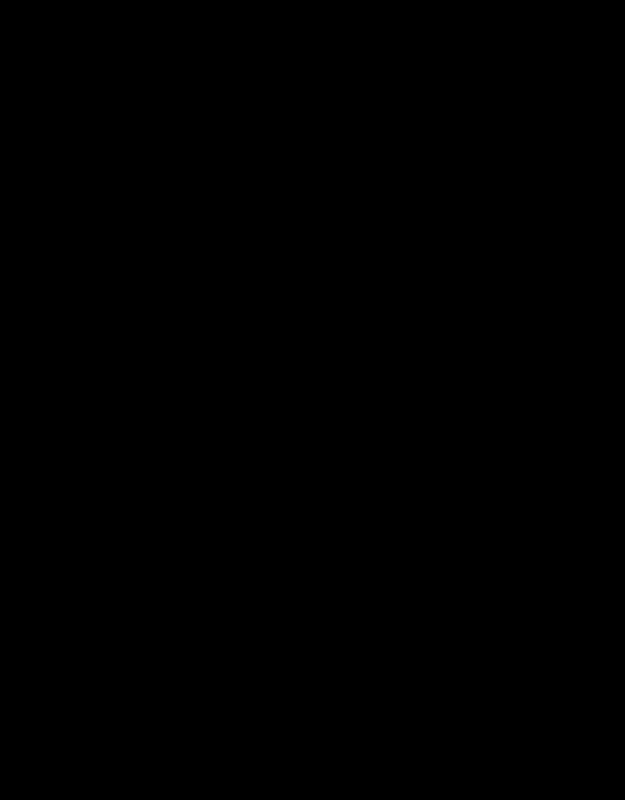

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from google.colab.patches import cv2_imshow

def apply_grabcut(image_path, rect, iter_count=5):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read the image.")
        return None

    # Resize the image if it's too large
    max_dim = 800
    if max(img.shape) > max_dim:
        scale = max_dim / max(img.shape)
        img = cv2.resize(img, (int(img.shape[1] * scale), int(img.shape[0] * scale)))

    # Create a mask initialized to the probable background
    mask = np.zeros(img.shape[:2], np.uint8)

    # Allocate memory for the temporary arrays used by the algorithm
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    # Apply the GrabCut algorithm
    cv2.grabCut(img, mask, rect, bgd_model, fgd_model, iter_count, cv2.GC_INIT_WITH_RECT)

    # Create the final mask where 0 and 2 denote background, 1 and 3 denote foreground
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

    # Apply the mask to get the segmented image
    segmented_img = img * mask2[:, :, np.newaxis]

    return img, mask2, segmented_img

def plot_results(original_img, mask, segmented_img):
    # Use cv2_imshow for displaying images in Google Colab
    print("Original Image:")
    cv2_imshow(original_img)
    print("Mask:")
    cv2_imshow((mask * 255).astype(np.uint8))
    print("Segmented Image:")
    cv2_imshow(segmented_img)

# Upload the image
uploaded = files.upload()
for file_name in uploaded.keys():
    image_path = file_name

# Define the rectangle for the initial foreground (x, y, width, height)
rect = (50, 50, 200, 150)  # Adjusted for a smaller rectangle

# Apply GrabCut algorithm
original_img, mask, segmented_img = apply_grabcut("/content/drive/MyDrive/IMAGEprossing/0_0_0.png", rect)

# Plot the results
plot_results(original_img, mask, segmented_img)


**GraphCUT**

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.4/798.4 kB 4.5 MB/s eta 0:00:00


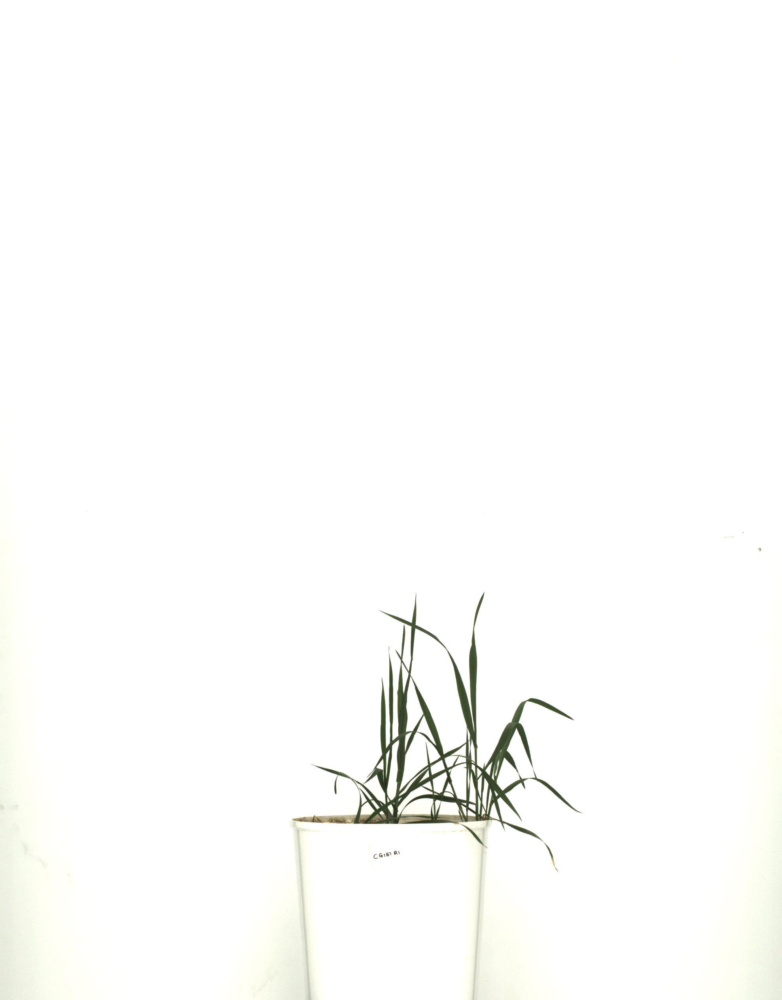

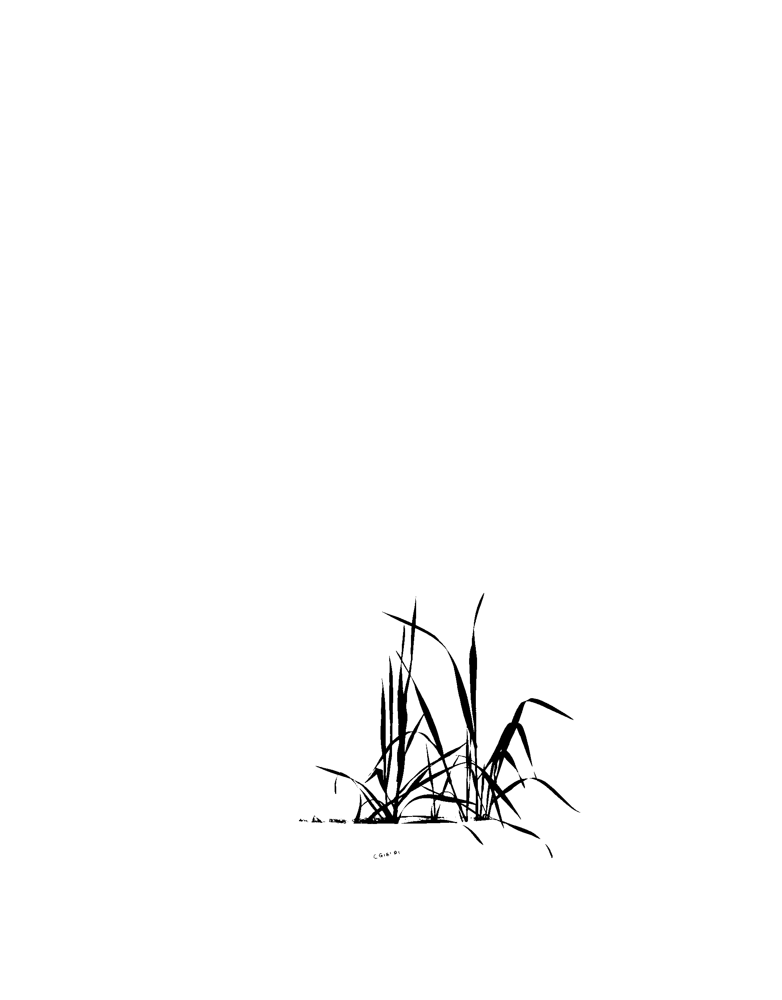

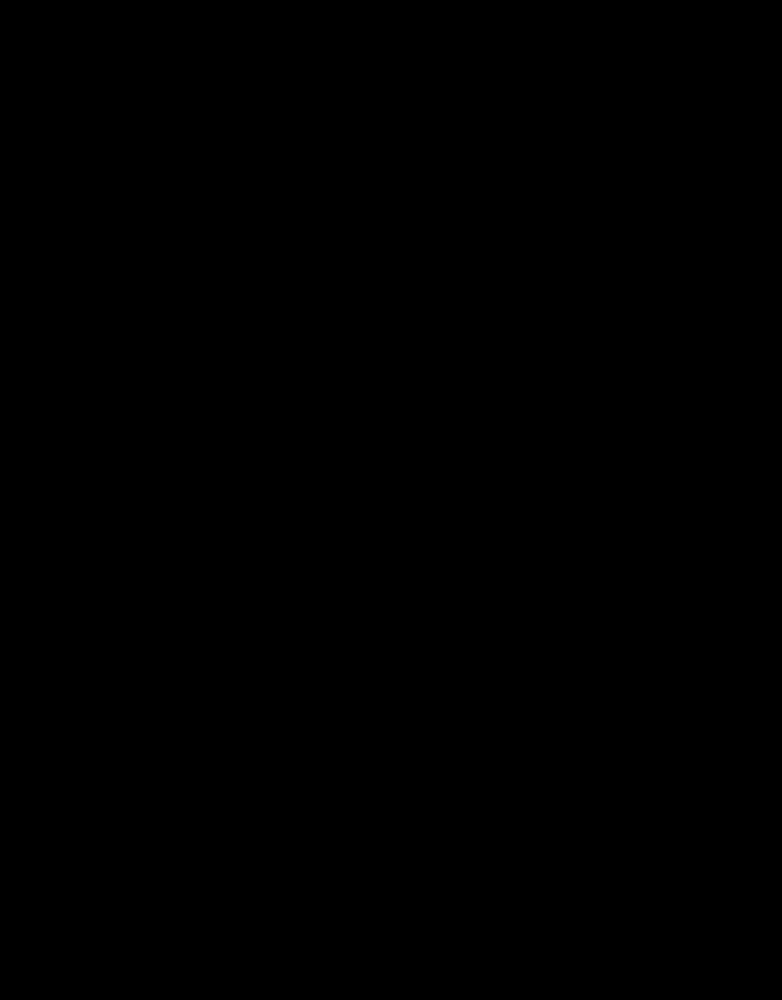

In [ ]:
!pip install PyMaxflow

import cv2
import numpy as np
import maxflow
from google.colab.patches import cv2_imshow

#def create_mask(image):
    """
    Create a binary mask from the image. This is a simple example using thresholding.
    You can modify this function based on your specific requirements.
    """
    #gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    #_, mask = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    mask = (mask > 127).astype(np.uint8)
    return mask

def create_graph(image, mask):
    rows, cols = image.shape[:2]
    g = maxflow.Graph[float]()
    node_ids = g.add_grid_nodes((rows, cols))

    structure = np.array([[0, 1, 0],
                          [1, 0, 1],
                          [0, 1, 0]])

    g.add_grid_edges(node_ids, structure=structure, weights=50)
    g.add_grid_tedges(node_ids, mask == 1, mask == 0)

    return g, node_ids

def segment_image(image, mask):
    g, node_ids = create_graph(image, mask)
    g.maxflow()
    segments = g.get_grid_segments(node_ids)

    segmented_image = np.zeros_like(image)
    segmented_image[segments] = image[segments]

    return segmented_image

def main(image_path):
    image = cv2.imread(image_path)
    mask = create_mask(image)

    segmented_image = segment_image(image, mask)

    # Display original image, mask, and segmented image
    cv2_imshow(image)
    cv2_imshow(mask * 255)  # Mask is binary, so multiply by 255 for display
    #cv2_imshow(segmented_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

if __name__ == "__main__":
    image_path = '/content/drive/MyDrive/IMAGEprossing/0_0_0.png'
    main(image_path)


Original_image


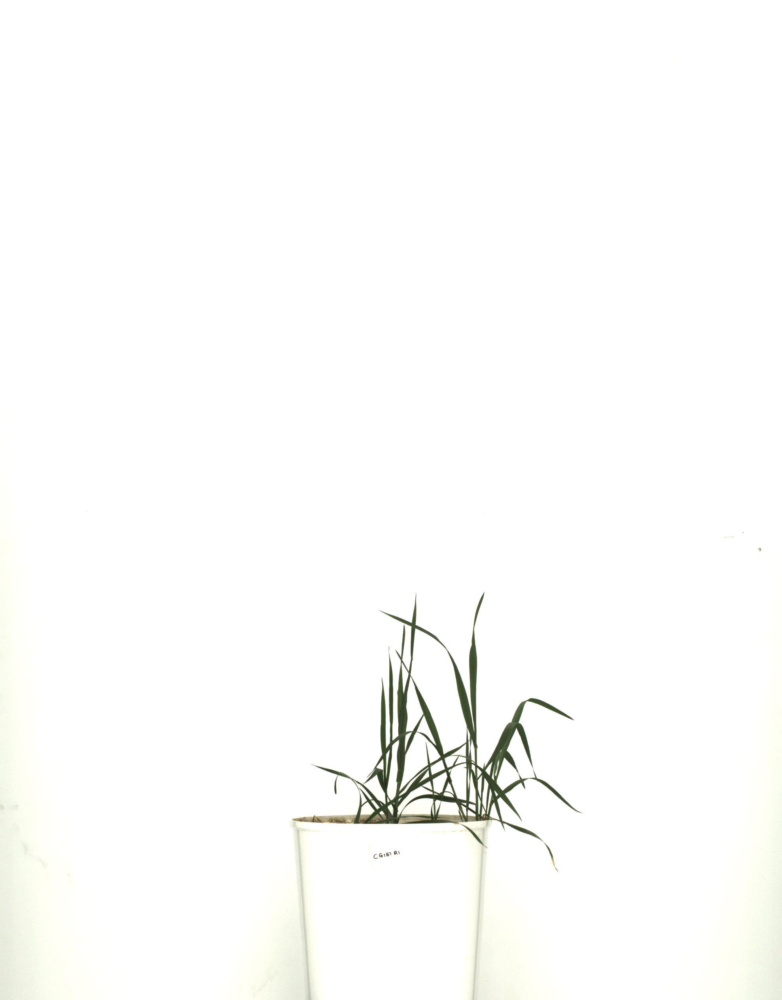

Segment_green


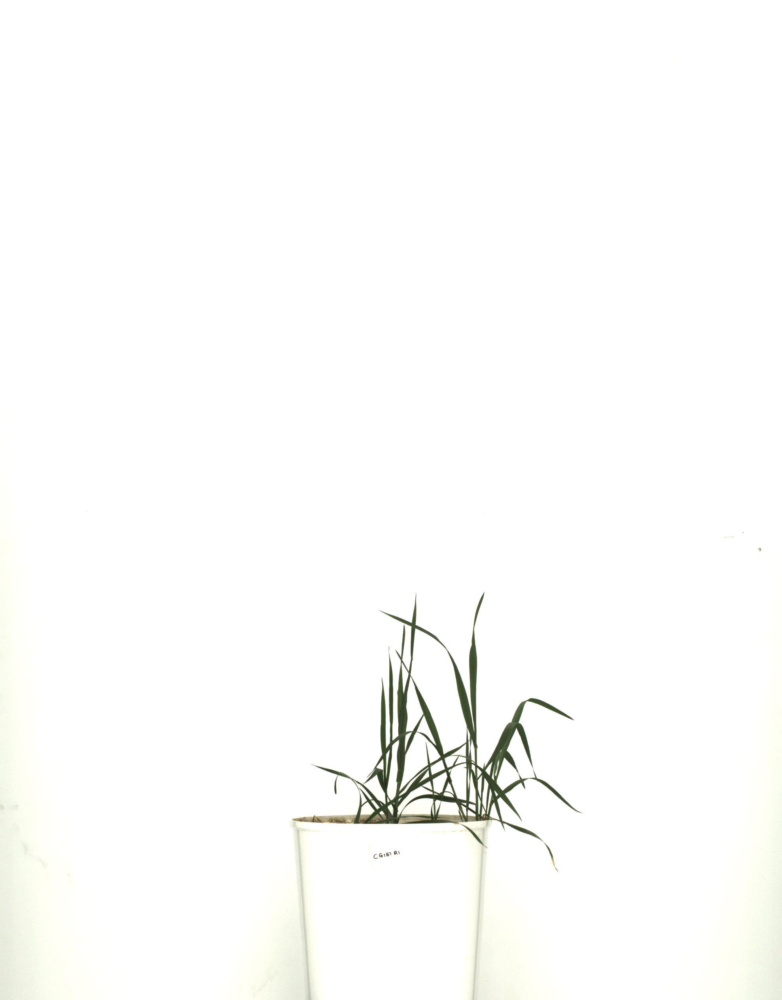

NameError: name 'morphological' is not defined

In [ ]:
!pip install PyMaxflow

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import maxflow

def create_mask(image):
    """
    Create a binary mask from the image. This is a simple example using thresholding.
    You can modify this function based on your specific requirements.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    mask = (mask > 127).astype(np.uint8)
    return mask

def create_graph(image, mask):
    rows, cols = image.shape[:2]
    g = maxflow.Graph[float]()
    node_ids = g.add_grid_nodes((rows, cols))

    structure = np.array([[0, 1, 0],
                          [1, 0, 1],
                          [0, 1, 0]])

    g.add_grid_edges(node_ids, structure=structure, weights=50)
    g.add_grid_tedges(node_ids, mask == 1, mask == 0)

    return g, node_ids

def segment_image(image, mask):
    g, node_ids = create_graph(image, mask)
    g.maxflow()
    segments = g.get_grid_segments(node_ids)

    segmented_image = np.zeros_like(image)
    segmented_image[segments] = image[segments]

    return segmented_image

def extract_green_with_white_background(image):
    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define the green color range in HSV
    lower_green = np.array([40, 40, 40])
    upper_green = np.array([70, 255, 255])

    # Create a mask for the green color
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Create a white background image
    white_background = np.ones_like(image) * 255

    # Extract the green portion of the image using the mask
    green_portion = cv2.bitwise_and(image, image, mask=mask)

    # Invert the mask to get the non-green portions
    mask_inv = cv2.bitwise_not(mask)

    # Extract the non-green portions from the white background
    background_portion = cv2.bitwise_and(white_background, white_background, mask=mask_inv)

    # Combine the green portion with the white background
    result = cv2.add(green_portion, background_portion)

    return mask, result

def neighborhood_analysis(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

    # Create an output image to draw the results
    output_image = np.ones(image.shape, dtype=np.uint8) * 255

    # Remove small components
    for i in range(1, num_labels):
        if stats[i, cv2.CC_STAT_AREA] >= 500:  # Adjust threshold as needed
            output_image[labels == i] = image[labels == i]

    return output_image, num_labels, stats, centroids
def erode(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.erode(image, kernel, iterations=1)

def dilate(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.dilate(image, kernel, iterations=1)

def open(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)

def close(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)

def segment_green(image):
    """
    This function should contain the logic for segmenting the green region in the image.
    You'll need to implement the actual segmentation algorithm here.
    """
    # Placeholder for the actual segmentation logic
    # Replace this with your segmentation code
    segmented_image = image.copy()  # Replace with your segmentation result
    return segmented_image

def main(image_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to load the image at {image_path}. Please check the file path and format.")
        return

    # Segment the green region
    print('Original_image')
    cv2_imshow(image)
    segmented_green = segment_green(image)
    print('Segment_green')
    cv2_imshow(segmented_green)
    image2 = morphological(segmented_green)
    print('Eroded_image')
    cv2_imshow(image2)
    image3 = dilated(segmented_green)
    print('Dilation applying on Segment_green image')
    cv2_imshow(image3)
    image4 = open(image3)  # because we have to sharp the image3(dilation_image)
    print('Opening_image applying on Dilation image')
    cv2_imshow(image4)
    image5 = morphological(image4)  # we have to apply Eroded on opening image
    print('apply Eroded on Opening image')
    cv2_imshow(image5)
    image6 = close(image5)
    print('applying Closing on Eroded Opening image')  # Because it is used primarily for filling small holes and gaps in an image, while preserving the shape and size of larger objects in the image.
    cv2_imshow(image6)

    # Extract green portion with white background
    mask, green_on_white_image = extract_green_with_white_background(image6)
    print('Green with white background')
    cv2_imshow(green_on_white_image)

    # Apply Graph Cut on the green_on_white_image
    segmented_image = segment_image(green_on_white_image, mask)
    print('Segmented image after Graph Cut')
    cv2_imshow(segmented_image)

    # Apply neighborhood analysis on the segmented image
    output_image, _, _, _ = neighborhood_analysis(segmented_image)  # unpack the tuple and take only the image
    print('Applying Neighborhood analysis on segmented image')
    cv2_imshow(output_image)  # display the image

if __name__ == "__main__":
    image_path = '/content/drive/MyDrive/IMAGEprossing/0_0_0.png'  # Update with the correct path
    main(image_path)


**Apply Morfological operator and after BlackWhite Mask**

Original_image


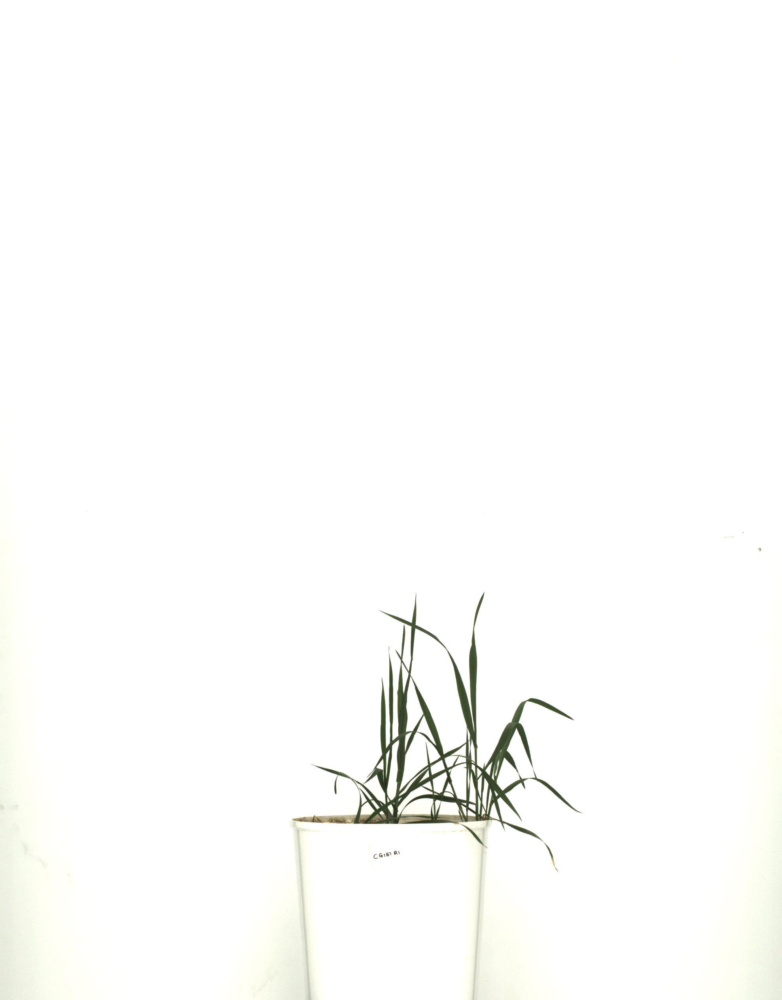

Segment_green


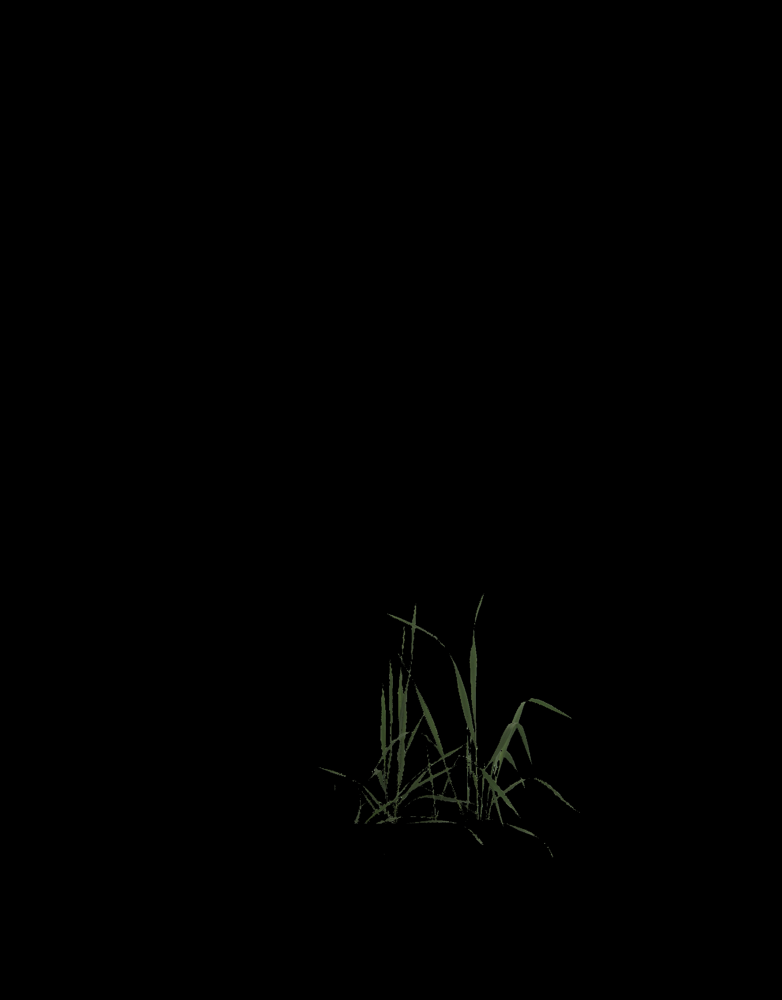

Eroded_image


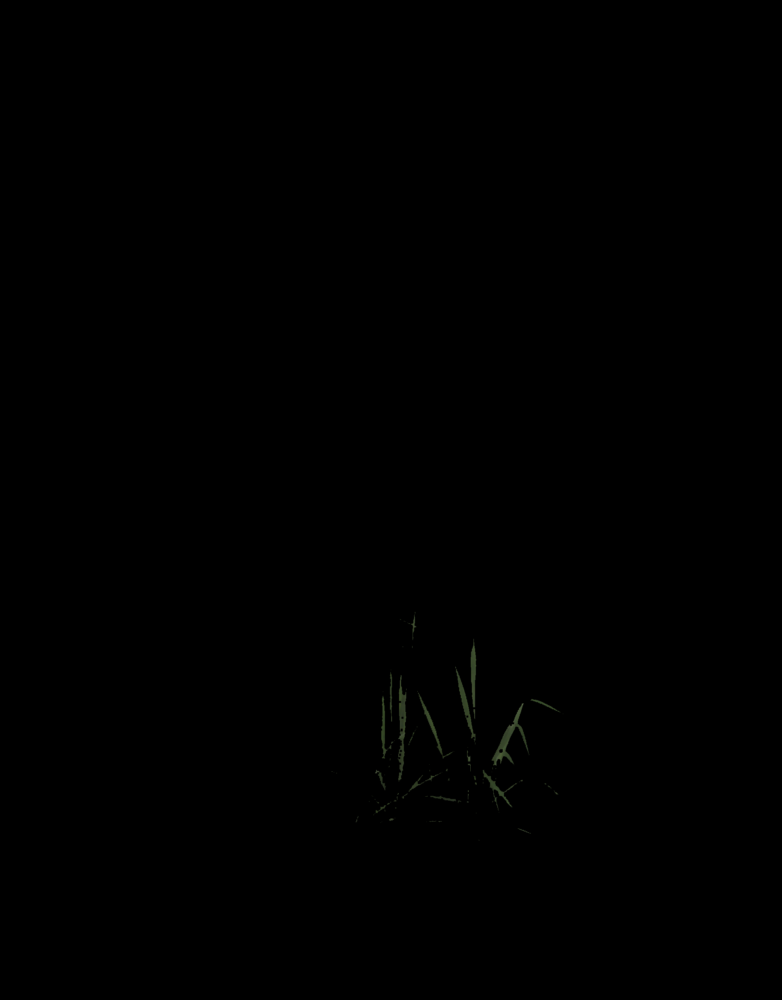

Dilation applying on Segment_green image


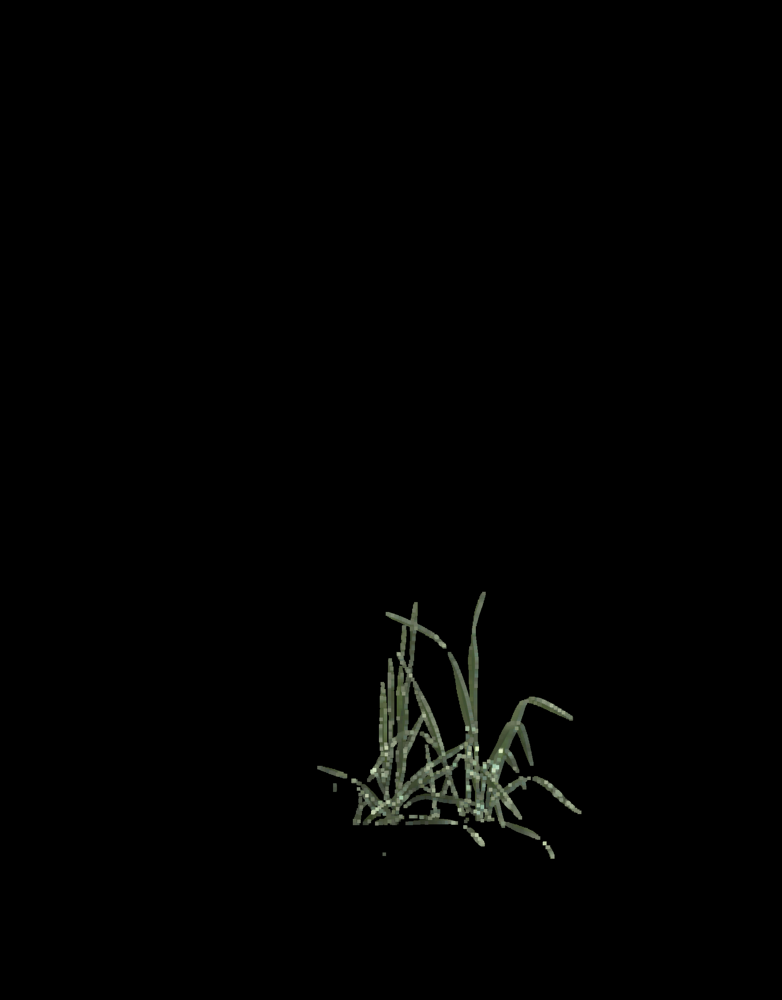

Opening_image applying on Dilation image


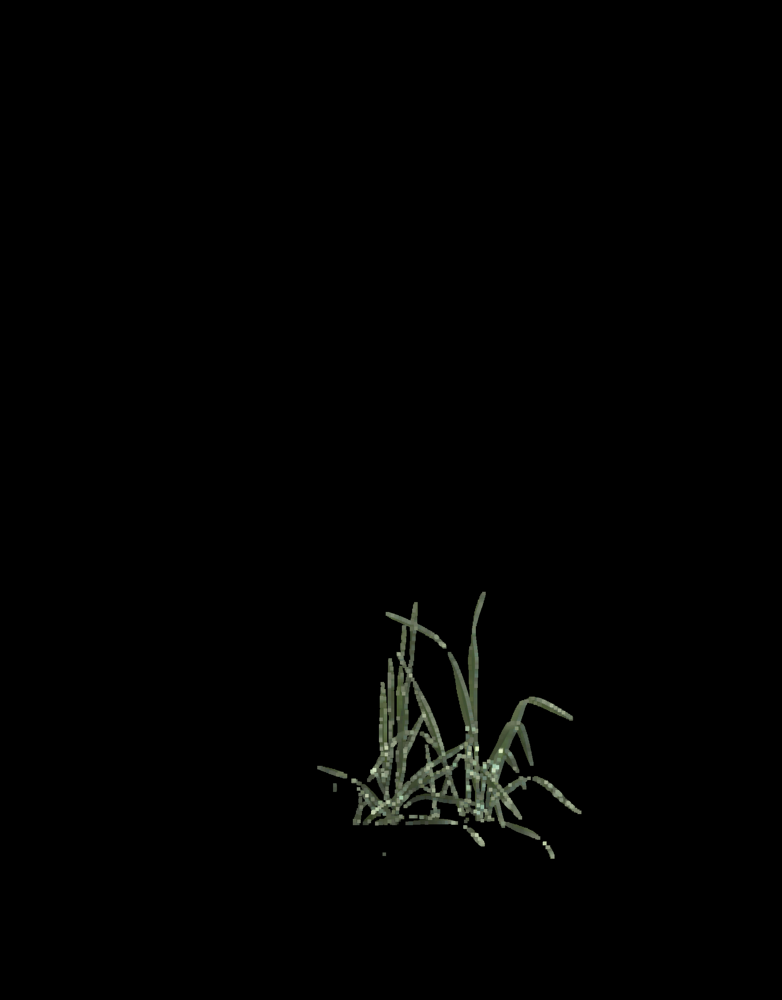

apply Eroded on Opening image


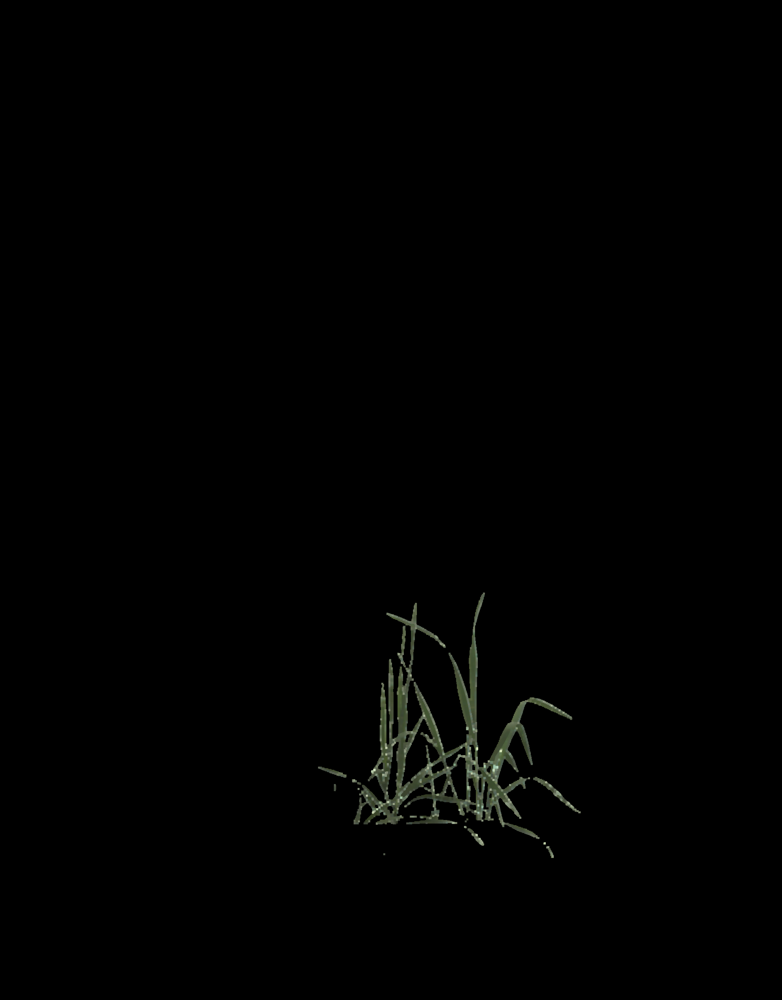

applying Closing on Eroded Opening image


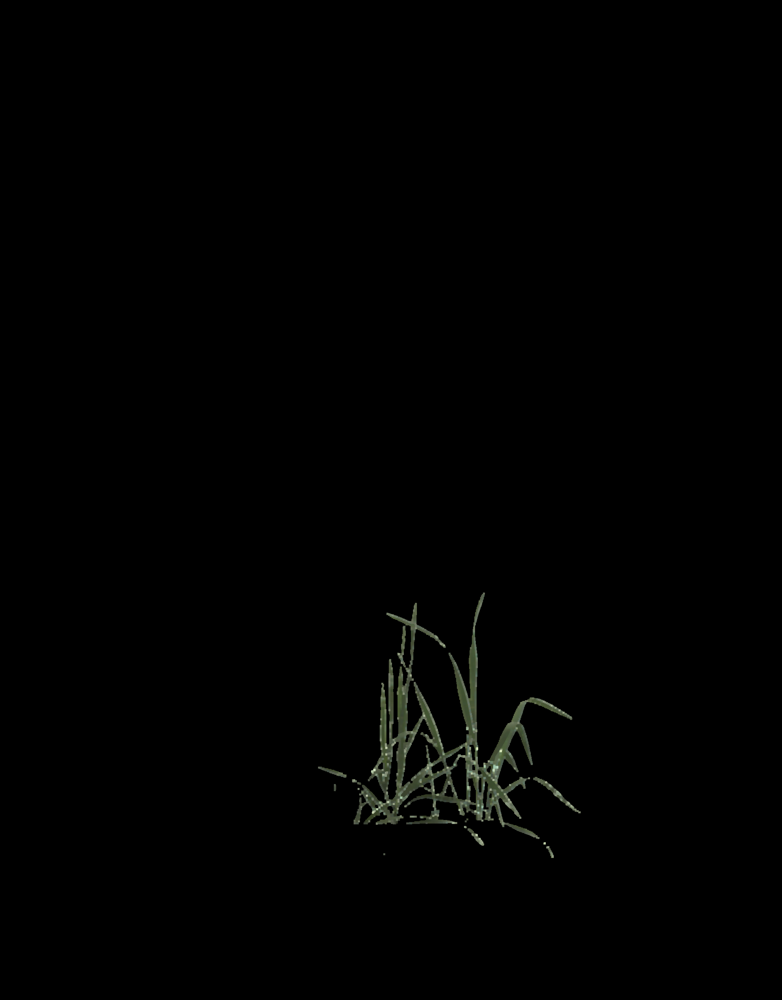

applying Denoising on Closing, Eroded, Opening image


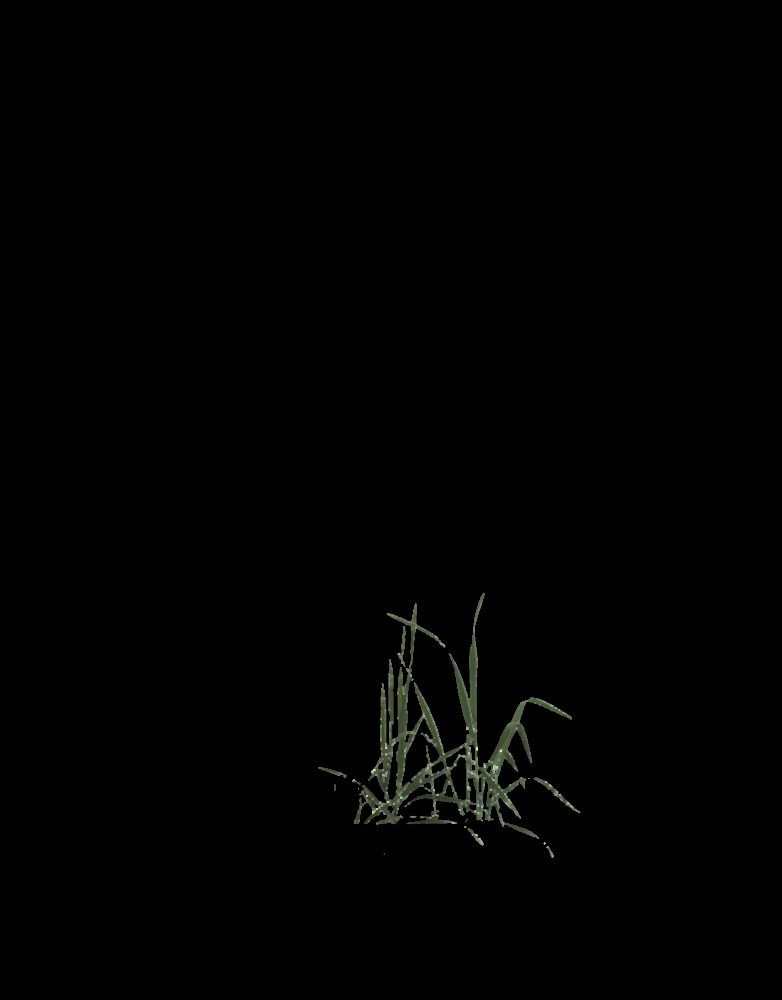

Inverted black and white mask


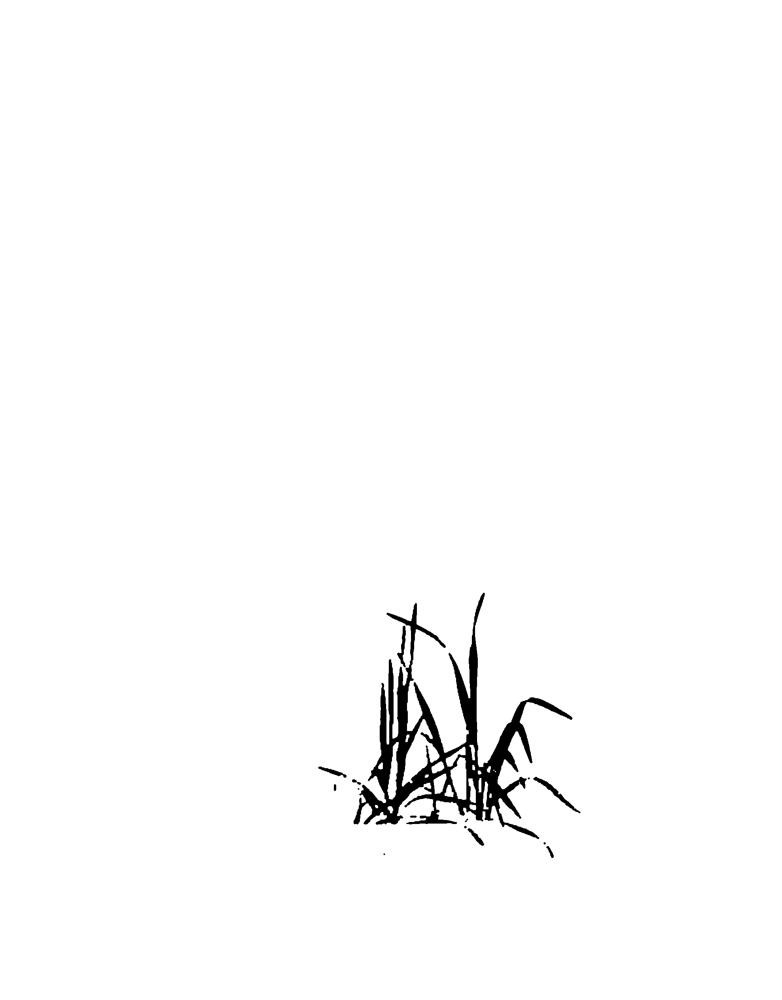

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import cv2_imshow in this cell

def neighborhood_analysis(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

    # Create an output image to draw the results
    output_image = np.zeros(image.shape, dtype=np.uint8)

    # Remove small components
    for i in range(1, num_labels):
        if stats[i, cv2.CC_STAT_AREA] >= 500:  # Adjust threshold as needed
            output_image[labels == i] = image[labels == i]

    return output_image, num_labels, stats, centroids

def segment_green(image, threshold=50):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower_green = np.array([40, 40, 40])  # Adjust these values if needed
    upper_green = np.array([70, 255, 255])  # Adjust these values if needed
    mask = cv2.inRange(hsv_image, lower_green, upper_green)
    segmented = cv2.bitwise_and(image, image, mask=mask)
    return segmented

def morphological(segmented_green):
    kernel = np.ones((5, 5), np.uint8)
    eroded = cv2.erode(segmented_green, kernel, iterations=1)
    return eroded

def dilated(segmented_green):
    kernel = np.ones((5, 5), np.uint8)
    dilat = cv2.dilate(segmented_green, kernel, iterations=2)
    return dilat

def open(image3):
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(image3, cv2.MORPH_OPEN, kernel)
    return opening

def close(image5):
    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(image5, cv2.MORPH_CLOSE, kernel)
    return closing

# Read the image
image_path = '/content/drive/MyDrive/IMAGEprossing/0_0_0.png'
image = cv2.imread(image_path)
if image is None:
    print(f"Error: Unable to load the image at {image_path}. Please check the file path and format.")
else:
    # Segment the green region
    print('Original_image')
    cv2_imshow(image)
    segmented_green = segment_green(image)
    print('Segment_green')
    cv2_imshow(segmented_green)
    image2 = morphological(segmented_green)
    print('Eroded_image')
    cv2_imshow(image2)
    image3 = dilated(segmented_green)
    print('Dilation applying on Segment_green image')
    cv2_imshow(image3)
    image4 = open(image3)  # Because we have to sharpen the image3 (dilation_image)
    print('Opening_image applying on Dilation image')
    cv2_imshow(image4)
    image5 = morphological(image4)  # We have to apply erosion on the opening image
    print('apply Eroded on Opening image')
    cv2_imshow(image5)
    image6 = close(image5)
    print('applying Closing on Eroded Opening image')  # It is used primarily for filling small holes and gaps in an image, while preserving the shape and size of larger objects in the image.
    cv2_imshow(image6)

    # Convert the image from BGR to HSV color space
    hsv = cv2.cvtColor(image6, cv2.COLOR_BGR2HSV)
    lower_bound = np.array([40, 40, 40])
    upper_bound = np.array([70, 255, 255])
    mask = cv2.inRange(hsv, lower_bound, upper_bound)
    # Apply median blur to reduce noise
    mask = cv2.medianBlur(mask, 5)
    green_only = cv2.bitwise_and(image6, image6, mask=mask)
    print('applying Denoising on Closing, Eroded, Opening image')
    cv2_imshow(green_only)

    # Convert the green_only image to grayscale
    gray_green_only = cv2.cvtColor(green_only, cv2.COLOR_BGR2GRAY)
    # Apply binary threshold to create a black and white mask
    _, bw_mask = cv2.threshold(gray_green_only, 1, 255, cv2.THRESH_BINARY)
    # Invert the black and white mask
    inverted_bw_mask = cv2.bitwise_not(bw_mask)
    print('Inverted black and white mask')
    cv2_imshow(inverted_bw_mask)


**GRAPH_CUT**

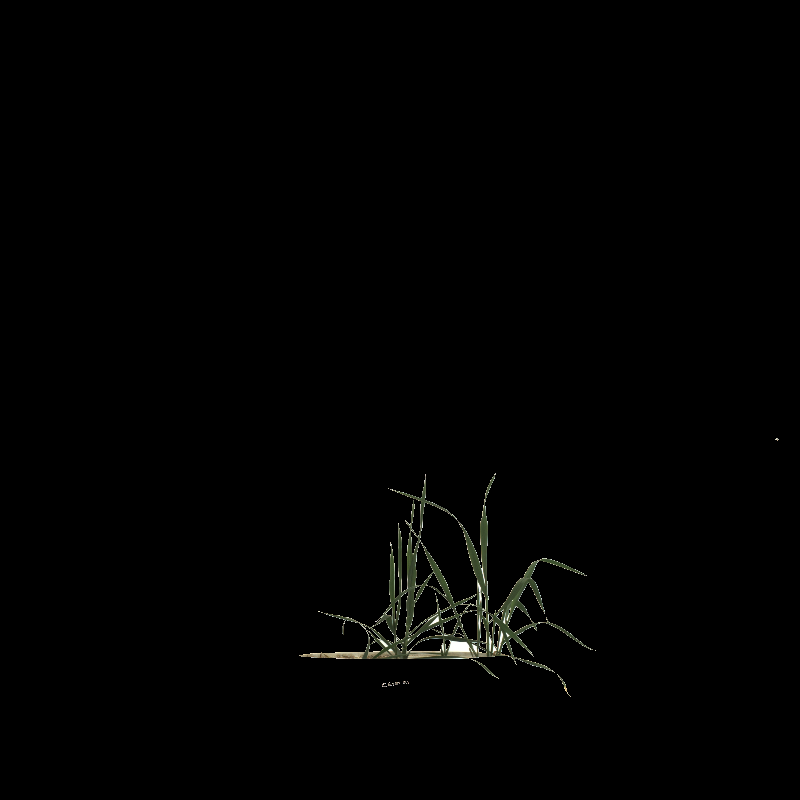

In [ ]:
import	numpy  as  np
import	cv2
from google.colab.patches import cv2_imshow

img  =	cv2.imread("/content/drive/MyDrive/IMAGEprossing/0_0_0.png")
img = cv2.resize(img,(800,800))
mask =	np.zeros(img.shape[:2],np.uint8)


bgdModel =  np.zeros((1,65),np.float64)*255
fgdModel =  np.zeros((1,65),np.float64)*255

#parameter(img,mask,rect,bgmodel,fgmodel,iter,method)
rect =	(134,150,660,730)
cv2.grabCut(img,mask,rect,bgdModel,fgdModel,5,
            cv2.GC_INIT_WITH_RECT)


mask2  =  np.where((mask==2)|(mask==0),0,1).astype('uint8')
img  =	img*mask2[:,:,np.newaxis]

cv2_imshow(img) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)
cv2.destroyAllWindows()

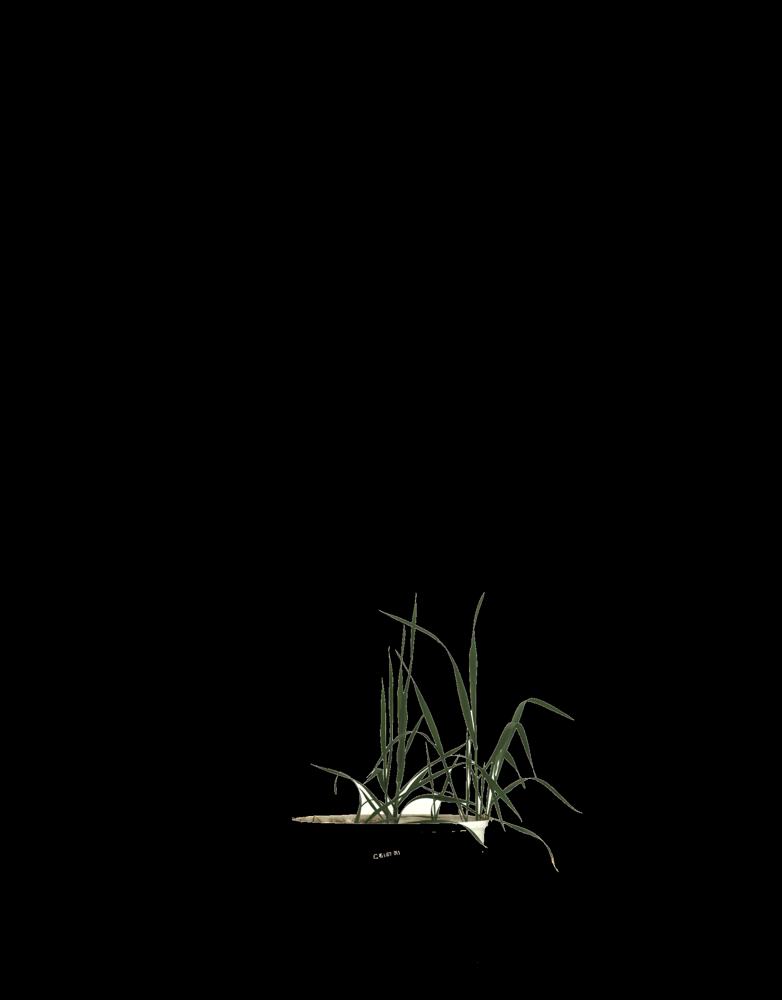

In [ ]:
import	numpy  as  np
import	cv2
from google.colab.patches import cv2_imshow

img  =	cv2.imread("/content/drive/MyDrive/IMAGEprossing/0_0_0.png")
img = cv2.resize(img,(1977,2528))
mask =	np.zeros(img.shape[:2],np.uint8)


bgdModel =  np.zeros((1,65),np.float64)*255
fgdModel =  np.zeros((1,65),np.float64)*255

#parameter(img,mask,rect,bgmodel,fgmodel,iter,method)
# Adjusted rectangle to fit within the resized image
rect =	(737, 1497, 1464, 2201)
cv2.grabCut(img,mask,rect,bgdModel,fgdModel,5,
            cv2.GC_INIT_WITH_RECT)


mask2  =  np.where((mask==2)|(mask==0),0,1).astype('uint8')
img  =	img*mask2[:,:,np.newaxis]

cv2_imshow(img) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)
cv2.destroyAllWindows()

 **Subtract Green portion of the GraohCut Image**

Inverted black and white mask


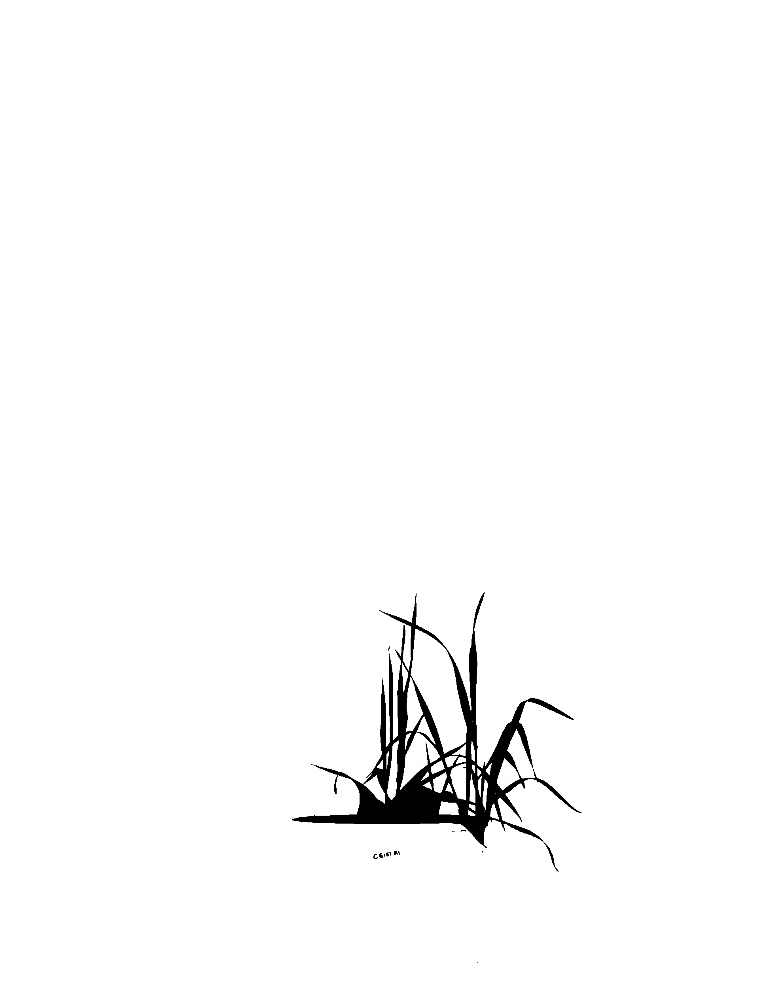

In [ ]:
import	numpy  as  np
import	cv2
from google.colab.patches import cv2_imshow

img  =	cv2.imread("/content/drive/MyDrive/IMAGEprossing/0_0_0.png")
img = cv2.resize(img,(1977,2528))
mask =	np.zeros(img.shape[:2],np.uint8)


bgdModel =  np.zeros((1,65),np.float64)*255
fgdModel =  np.zeros((1,65),np.float64)*255

#parameter(img,mask,rect,bgmodel,fgmodel,iter,method)
# Adjusted rectangle to fit within the resized image
rect =	(737, 1497, 1464, 2201)
cv2.grabCut(img,mask,rect,bgdModel,fgdModel,5,
            cv2.GC_INIT_WITH_RECT)


mask2  =  np.where((mask==2)|(mask==0),0,1).astype('uint8')
img  =	img*mask2[:,:,np.newaxis]

# Removed the unexpected indentation
gray_green_only = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Apply binary threshold to create a black and white mask
_, bw_mask = cv2.threshold(gray_green_only, 1, 255, cv2.THRESH_BINARY)
# Invert the black and white mask
inverted_bw_mask = cv2.bitwise_not(bw_mask)
print('Inverted black and white mask')
cv2_imshow(inverted_bw_mask)

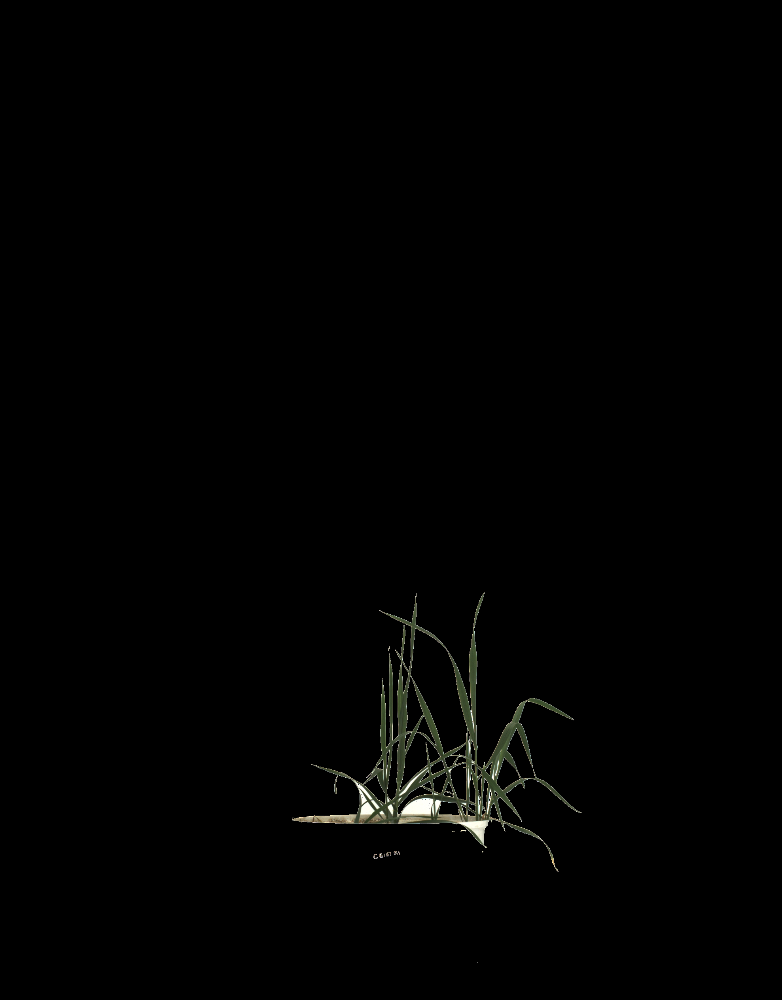

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import the patch

# Load the image
image_path = '/content/drive/MyDrive/IMAGEprossing/graphCutImg.png'
image = cv2.imread(image_path)

# Check if the image was loaded successfully
if image is None:
    raise FileNotFoundError(f"Image not found at path: {image_path}")

# Define white and black colors
white = [255, 255, 255]
black = [0, 0, 0]

# Convert all white pixels to black
image[np.all(image == white, axis=-1)] = black

# Save the modified image
output_path = '/mnt/data/graphCutImg_black_pixels.png'
cv2.imwrite(output_path, image)

# Display the result using cv2_imshow
cv2_imshow(image) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)
cv2.destroyAllWindows()

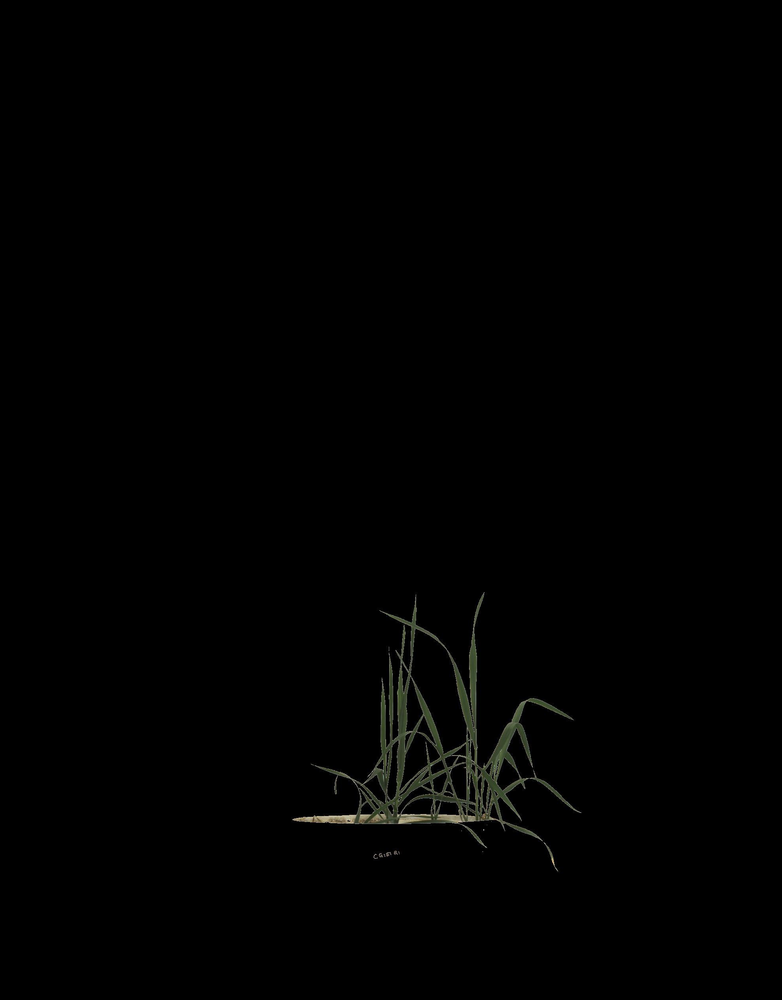

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow # Import the patch for displaying images in Colab

# Load the image
image_path = '/content/drive/MyDrive/IMAGEprossing/graphCutImg.png'
image = cv2.imread(image_path)

# Check if the image was loaded successfully
if image is None:
    raise FileNotFoundError(f"Image not found at path: {image_path}")

# Define the threshold to consider a pixel as white
# This can be adjusted if the white is not pure white
threshold = 170

# Convert the image to a binary mask where white pixels become True
mask = np.all(image >= threshold, axis=-1)

# Set all pixels that are white to black
image[mask] = [0, 0, 0]

# Save the modified image
output_path = '/mnt/data/graphCutImg_black_pixels.png'
cv2.imwrite(output_path, image)

# Display the result using cv2_imshow from the imported patch
cv2_imshow(image) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)
cv2.destroyAllWindows()

**now check Green intensity of the picture and overall intensity of this pictue**
The intensity of a particular color channel (e.g., green) represents the brightness or strength of that specific color in each pixel.

Overall intensity refers to the combined brightness or strength of all color channels in the image

In [ ]:
def calculate_mean_intensity_color(image_path):
    # Load the image in color mode
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)

    if image is None:
        raise ValueError(f"Image not found at {image_path}")

    # Calculate the mean intensity for each channel
    mean_intensity_per_channel = cv2.mean(image)
    # Extract the green channel
    green_channel = image[:, :, 1]

    # Calculate the mean intensity of the green channel
    mean_green_intensity = np.mean(green_channel)
    k=np.mean(mean_intensity_per_channel)

    return mean_intensity_per_channel, mean_green_intensity,k

if __name__ == "__main__":
    image_path = '/content/drive/MyDrive/IMAGEprossing/GraphCutToRemoveTheWhitePixel.png'  # Replace with the path to your image
    mean_intensity_per_channel, mean_green_intensity,k = calculate_mean_intensity_color(image_path)
    print(f"The mean intensity per channel of the image is: {mean_intensity_per_channel}")
    print(f"The mean intensity per channel of the image is: {mean_green_intensity}")
    print(f"The mean intensity per channel of the image is: {k}")

The mean intensity per channel of the image is: (0.9398622129168988, 1.29804920349846, 1.190051293994865, 0.0)
The mean intensity per channel of the image is: 1.29804920349846
The mean intensity per channel of the image is: 0.856990677602556


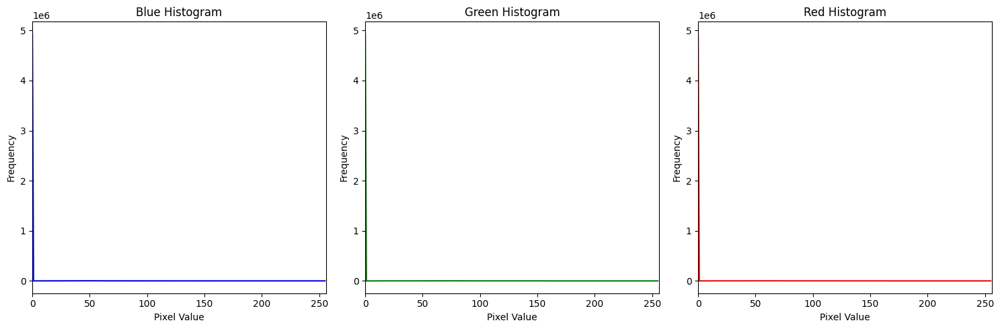

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_histogram_color(image_path):
    # Load the image in color mode
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)

    if image is None:
        raise ValueError(f"Image not found at {image_path}")

    # Split the image into B, G, R channels
    channels = cv2.split(image)
    colors = ('b', 'g', 'r')
    channel_names = ('Blue', 'Green', 'Red')

    plt.figure(figsize=(15, 5))

    for (channel, color, channel_name) in zip(channels, colors, channel_names):
        plt.subplot(1, 3, colors.index(color) + 1)
        # Calculate the histogram for each channel
        histogram = cv2.calcHist([channel], [0], None, [256], [0, 256])
        plt.plot(histogram, color=color)
        plt.title(f'{channel_name} Histogram')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        plt.xlim([0, 256])

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    image_path = '/content/drive/MyDrive/IMAGEprossing/GraphCutToRemoveTheWhitePixel.png'  # Replace with the path to your color image
    plot_histogram_color(image_path)


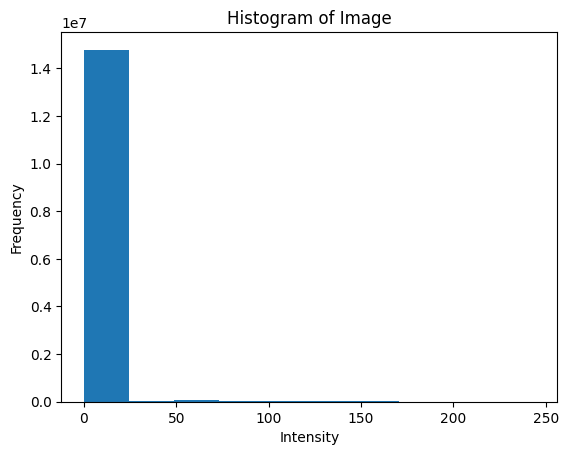

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # Import the Colab patch for imshow

img = cv.imread('/content/drive/MyDrive/IMAGEprossing/GraphCutToRemoveTheWhitePixel.png')

# Flatten the image array to 1D before plotting the histogram
flattened_img = img.flatten()

plt.hist(flattened_img)
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.title('Histogram of Image')
plt.show()

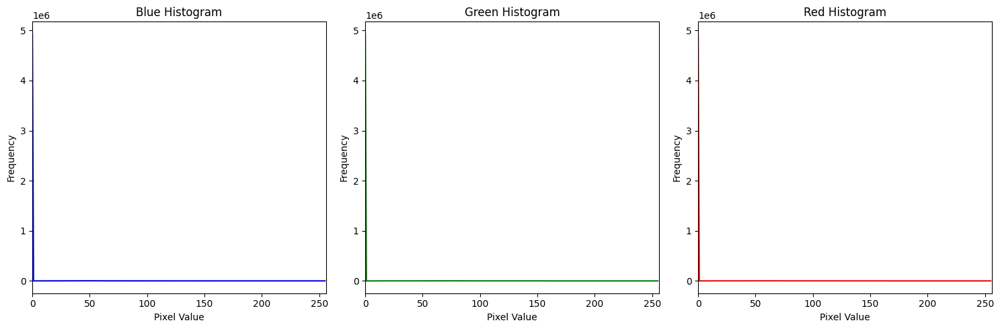

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
# Update the image path to the correct location
image_path = '/content/drive/MyDrive/IMAGEprossing/GraphCutToRemoveTheWhitePixel.png'

# Verify if the file exists
import os
if not os.path.exists(image_path):
    raise FileNotFoundError(f"The image file was not found at: {image_path}")

image = cv2.imread(image_path)

# Check if the image is loaded successfully
if image is None:
    raise ValueError(f"Failed to load image. Check file format and permissions for: {image_path}")

# Split the image into B, G, R channels
channels = cv2.split(image)
colors = ('b', 'g', 'r')
channel_names = ('Blue', 'Green', 'Red')

plt.figure(figsize=(15, 5))

# Plot histogram for each color channel
for (channel, color, channel_name) in zip(channels, colors, channel_names):
    plt.subplot(1, 3, colors.index(color) + 1)
    histogram = cv2.calcHist([channel], [0], None, [256], [0, 256])
    plt.plot(histogram, color=color)
    plt.title(f'{channel_name} Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.xlim([0, 256])

plt.tight_layout()
plt.show()

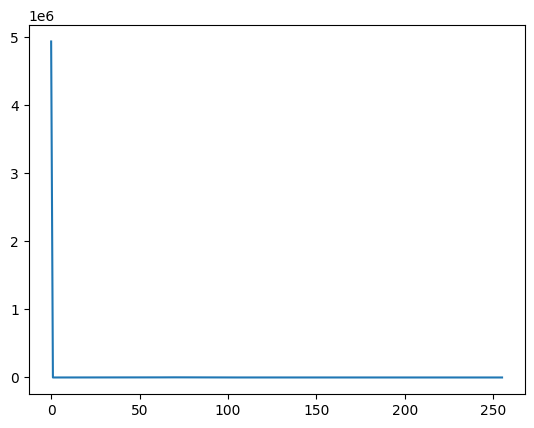

In [ ]:
# importing required libraries of opencv
import cv2

# importing library for plotting
from matplotlib import pyplot as plt

# reads an input image
img = cv2.imread( '/content/drive/MyDrive/IMAGEprossing/GraphCutToRemoveTheWhitePixel.png',0)

# find frequency of pixels in range 0-255
histr = cv2.calcHist([img],[0],None,[256],[0,256])

# show the plotting graph of an image
plt.plot(histr)
plt.show()


**Edge_Dedction**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


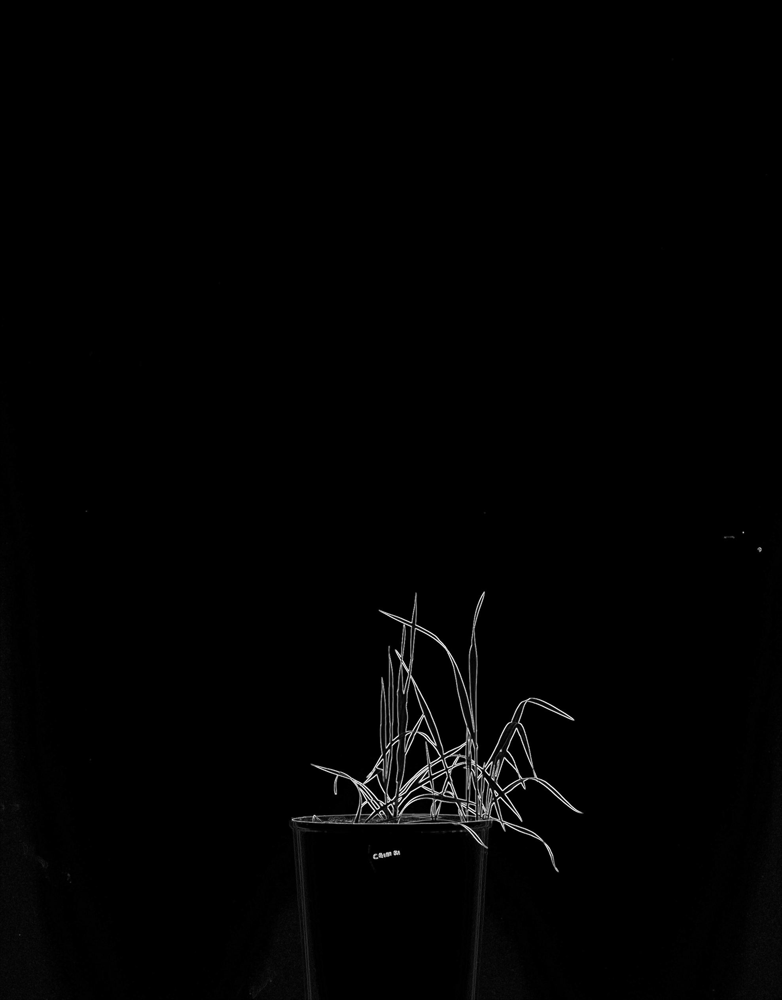

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # Import cv2_imshow for Colab

# Mount Google Drive (if the image is there)v
from google.colab import drive
drive.mount('/content/drive')

# Load an image in grayscale mode - Verify the path!
image_path = '/content/drive/MyDrive/IMAGEprossing/0_0_0.png'  # Double-check this path
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Check if the image loaded successfully
if image is None:
    print(f"Error: Could not load image from {image_path}. Check the file path and permissions.")
else:
    # Apply Sobel operator to find edges in the x direction with high precision
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)

    # Apply Sobel operator to find edges in the y direction with high precision
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

    # Convert the results back to uint8 for display
    abs_sobelx = cv2.convertScaleAbs(sobelx)
    abs_sobely = cv2.convertScaleAbs(sobely)

    # Combine the two gradients
    sobel_combined = cv2.addWeighted(abs_sobelx, 0.5, abs_sobely, 0.5, 0)

    # Display the result using cv2_imshow
    cv2_imshow(sobel_combined)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [ ]:
pip install opencv-python numpy scikit-learn


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Dominant color 0: HSV [0 0 0]


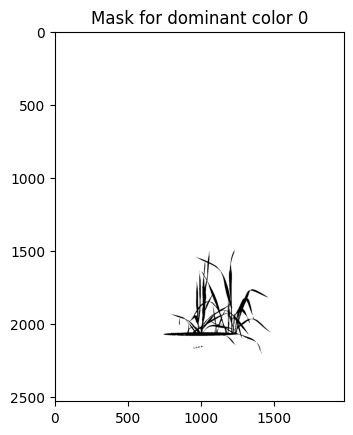

Dominant color 1: HSV [ 35  55 127]


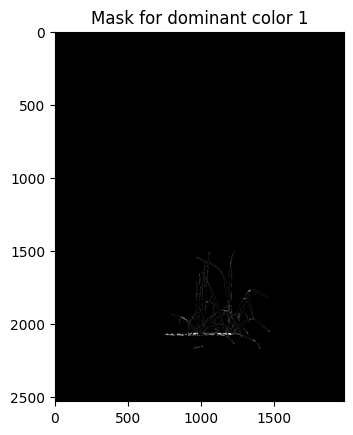

Dominant color 2: HSV [ 33  46 171]


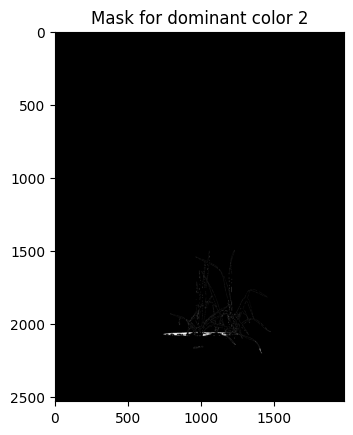

Dominant color 3: HSV [42 97 74]


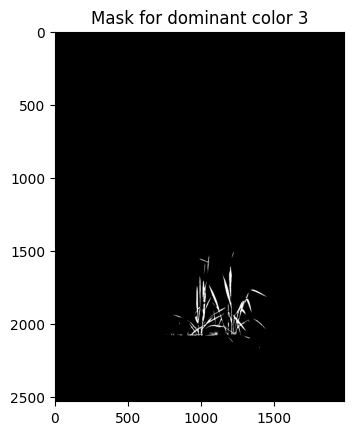

Dominant color 4: HSV [41 68 85]


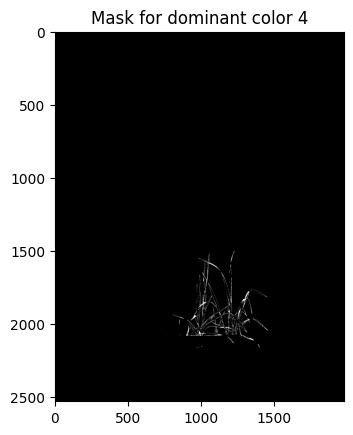

Dominant color 0:
  HSV: [0 0 0]
  Min HSV: [0. 0. 0.]
  Max HSV: [0. 0. 0.]
Dominant color 1:
  HSV: [ 35  55 127]
  Min HSV: [ 0.  2. 91.]
  Max HSV: [175. 128. 162.]
Dominant color 2:
  HSV: [ 33  46 171]
  Min HSV: [  0.   2. 141.]
  Max HSV: [178. 143. 244.]
Dominant color 3:
  HSV: [42 97 74]
  Min HSV: [11. 72. 39.]
  Max HSV: [ 67. 154. 143.]
Dominant color 4:
  HSV: [41 68 85]
  Min HSV: [ 3.  3. 46.]
  Max HSV: [178.  96. 116.]


In [ ]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('')
/content/drive/MyDrive/IMAGEprossing/GraphCutToRemoveTheWhitePixel.png
# Convert the image to RGB color space (because OpenCV uses BGR by default)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the image to the HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)


# Reshape the image to be a list of pixels
pixel_values = hsv_image.reshape((-1, 3))
pixel_values = np.float32(pixel_values)


k = 5
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(pixel_values)

# Get the cluster centers (these are the HSV values of the dominant colors)
dominant_colors = kmeans.cluster_centers_

# Convert the dominant colors to integers
dominant_colors = np.uint8(dominant_colors)


# Get the labels for each pixel
labels = kmeans.labels_

# Create a mask for each dominant color
masks = []
for i in range(k):
    mask = np.zeros(hsv_image.shape[:2], dtype="uint8")
    mask[labels.reshape(hsv_image.shape[:2]) == i] = 255
    masks.append(mask)



# Display the dominant colors and their masks
for i in range(k):
    # Display the dominant color
    color = dominant_colors[i]
    print(f'Dominant color {i}: HSV {color}')

    # Display the mask
    plt.imshow(cv2.cvtColor(masks[i], cv2.COLOR_GRAY2RGB))
    plt.title(f'Mask for dominant color {i}')
    plt.show()


for i in range(k):
    # Extract the HSV values of the current cluster
    cluster_hsv_values = pixel_values[labels == i]

    # Calculate the min and max HSV values
    min_hsv = np.min(cluster_hsv_values, axis=0)
    max_hsv = np.max(cluster_hsv_values, axis=0)

    print(f'Dominant color {i}:')
    print(f'  HSV: {dominant_colors[i]}')
    print(f'  Min HSV: {min_hsv}')
    print(f'  Max HSV: {max_hsv}')



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Dominant color 0: HSV [0 0 0]


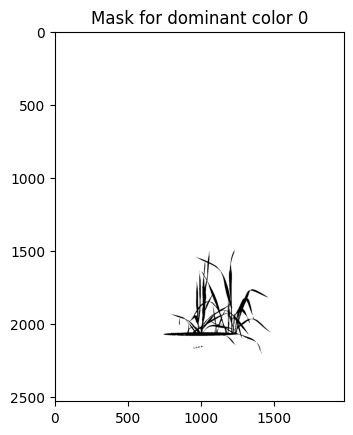

Dominant color 1: HSV [ 32  49 160]


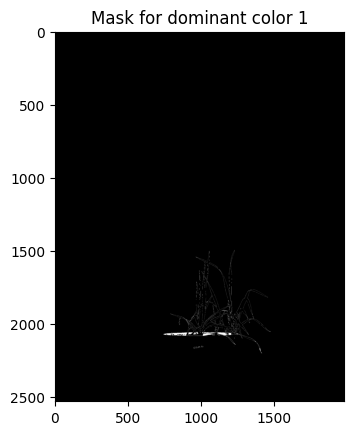

Dominant color 2: HSV [42 95 75]


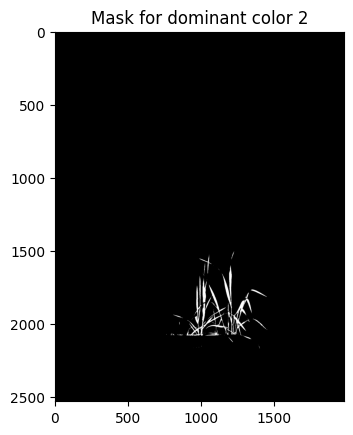

Dominant color 3: HSV [40 62 96]


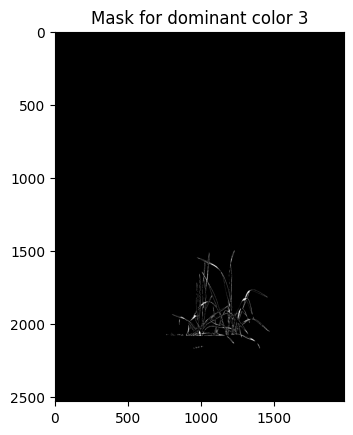

Threshold range for dominant color 0:
  Lower HSV: [0. 0. 0.]
  Upper HSV: [0. 0. 0.]
Threshold range for dominant color 1:
  Lower HSV: [  0.   2. 119.]
  Upper HSV: [178. 143. 244.]
Threshold range for dominant color 2:
  Lower HSV: [11. 58. 39.]
  Upper HSV: [ 91. 154. 144.]
Threshold range for dominant color 3:
  Lower HSV: [ 0.  2. 49.]
  Upper HSV: [178. 110. 137.]


In [ ]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/drive/MyDrive/IMAGEprossing/GraphCutToRemoveTheWhitePixel.png')

# Convert the image to RGB color space (because OpenCV uses BGR by default)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the image to the HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Reshape the image to be a list of pixels
pixel_values = hsv_image.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# Define the number of clusters (colors) to identify
k = 4
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(pixel_values)

# Get the cluster centers (these are the HSV values of the dominant colors)
dominant_colors = kmeans.cluster_centers_

# Convert the dominant colors to integers
dominant_colors = np.uint8(dominant_colors)

# Get the labels for each pixel
labels = kmeans.labels_

# Create a mask for each dominant color
masks = []
for i in range(k):
    mask = np.zeros(hsv_image.shape[:2], dtype="uint8")
    mask[labels.reshape(hsv_image.shape[:2]) == i] = 255
    masks.append(mask)

# Display the dominant colors and their masks
for i in range(k):
    # Display the dominant color
    color = dominant_colors[i]
    print(f'Dominant color {i}: HSV {color}')

    # Display the mask
    plt.imshow(cv2.cvtColor(masks[i], cv2.COLOR_GRAY2RGB))
    plt.title(f'Mask for dominant color {i}')
    plt.show()

# Calculate threshold values for each dominant color
for i in range(k):
    # Extract the HSV values of the current cluster
    cluster_hsv_values = pixel_values[labels == i]

    # Calculate the min and max HSV values
    min_hsv = np.min(cluster_hsv_values, axis=0)
    max_hsv = np.max(cluster_hsv_values, axis=0)

    # Print the threshold values
    print(f'Threshold range for dominant color {i}:')
    print(f'  Lower HSV: {min_hsv}')
    print(f'  Upper HSV: {max_hsv}')
